# MVP Sprint I - PUC Rio

## Aluna : Lucia Helena Barros dos Santos

# Descrição do Problema: 

As mudanças climáticas cada vez mais, tem se apresentado como uma das pautas mais importantes, quando a discussão gira em torno de perspectivas de futuro, desta forma alguns elementos que compõem estudos climáticos passam a ter elevada relevância nas discussões, um destes elementos são os poluentes atmosféricos.


Em virtude do aumento da temperatura da terra e do aumento de emissão de gases na atmosfera, o conhecimento do comportamento da emissão de poluentes como ozônio (O3), dióxido de enxofre (SO2), hidrocarboneto total (HCT), metano (CH4) e material particulado (PM10 e PM2,5) passaram a ter sua importância, não apenas para a preservação do meio ambiente, mas também para a área da saúde, dada a relação direta entre estes citados e muitos outros poluentes com a prevenção de doenças respiratórias e cardiovasculares.


Dadas as características geográficas da cidade litorânea do Rio de Janeiro, tem se ampliado o uso da cidade como modelo para estudos longitudinais sobre a evolução de poluentes atmosféricos e suas consequências, seja no controle e monitoramento de desastres ambientais seja no controle de doenças fortemente relacionadas com o aumento da poluição do ar.


A base de dados utilizada neste trabalho refere-se às medições realizadas pela estação meteorológicas localizada no bairro de IRAJÁ, no período entre 2012 e 2021 com medições realizadas no espaço de meia hora entre elas, sendo então uma base de dados temporal.


A escolha da estação IRAJÁ ocorreu devido a mesma permitir uma grande variedade de poluentes a serem medidos, permitindo observar no tempo em quais períodos de tempo, como ano, mês, dia ou hora e para quais poluentes ocorreram falhas na estação, acarretando períodos sem medição. 


O problema a ser estudado consiste em um estudo supervisionado uma vez que temos medições longitudinais, no peróodo de 2012 a 2021 que permitirão em algum momento futuro, realizarmos predições quanto ao comportamento dos poluentes e sua interferência na saúde.

 
## Dicionário de dados:

##### - **Identificacao:** Chave de identificação do registro no banco original
##### - **Data:** Data e horário de medição do poluente pela estação
##### - **Estacao:** Sigla da estação meteorológica Irajá (IR)

---

#### *Variáveis Meteorológicas medidas pela Estação IR*
##### - **Chuva:** Volume de Chuva medida em milímetro (mm)
##### - **RS:** Radiação Solar medida em milímetro (W/m2)
##### - **Pres:** Pressão Atmosférica medida em milibar (mbar)
##### - **Temp:** Temperatura medida em graus Celcius (°C)
##### - **UR:** Umidade Relativa medida em percentual (%)
##### - **Dir_Vento:** Direção do Vento medido em graus (°)
##### - **Vel_Vento:** Umidade Relativa medida em percentual (%)

---

#### *Poluentes medidos pela Estação IR*
##### - **SO2:** Dióxido de Exofre medido em Micrograma por Metro Cúbico (µg/m3) 
##### - **NO2:** Dióxido de Nitrogênio medido em Micrograma por Metro Cúbico (µg/m3)
##### - **HCT:** Hidrocarboneto Total medido em partes por milhão (ppm)
##### - **CH4:** Metano medido em partes por milhão (ppm)
##### - **CO:** Monóxido de Carbono medido em partes por milhão (ppm)
##### - **NO:** Monóxido de Nitrogênio medido em Micrograma por Metro Cúbico (µg/m3)
##### - **NOx:** Óxido de Nitrogênio medido em Micrograma por Metro Cúbico (µg/m3)
##### - **O3:** Ozônio medido Micrograma por Metro Cúbico (µg/m3) 
##### - **PM10:** Material Particulado <10 Micrograma por Metro Cúbico (µg/m3)
##### - **PM2_5:** Material Particulado <2_5 Micrograma por Metro Cúbico (µg/m3)

---

*OBS: Para mais detalhes sobre este dataset, consulte: https://www.data.rio/datasets/PCRJ::qualidade-do-ar-dados-hor%C3%A1rios/explore?layer=2

## Importando bibliotecas 

In [5]:
# Importação brbliotecas necessárias

import pandas as pd
import numpy as np
import os # para o retorno do caminho dos dados - 'os.chdir'
import datetime # para o tratamento de datas
import missingno as ms # para tratamento de valores faltantes "missing"
import missingno as msno # para tratamento de valores faltantes "missing"
import matplotlib.pyplot as plt # biblioteca para criação de gráficos
import plotly.graph_objects as go
import seaborn as sns # biblioteca para criação de gráficos
from plotly.subplots import make_subplots
from sklearn.preprocessing import MinMaxScaler # biblioteca para normalização
from sklearn.preprocessing import StandardScaler # biblioteca para padronização

from sklearn.preprocessing import OrdinalEncoder 
from sklearn.preprocessing import OneHotEncoder 

from sklearn.model_selection import train_test_split # criação dados treino e teste
from datetime import date, datetime # para conversão de datas

## Criando Funções

In [6]:
# Função que cria variável "estacao_ano" para identificar as estações climáticas
# A função "calcula_estacao_ano" a seguir foi obtida através do link abaixo

# https://elibrary.tips/em-python-as-quatro-estaoes-do-ano-variam-de-acordo-com-as-datas-primavera-2.html


def calcula_estacao_ano(dt):
  vdia = dt.day
  vmes = dt.month
 
  if vmes in (1,2):
    return "Verão"
  elif vmes == 3:
    if vdia < 21:
      return "Verão"
    else:
      return "Outono" 
  elif vmes in (4,5):    
      return "Outono"
  elif vmes == 6:
      if vdia < 21:
        return "Outono" 
      else:    
        return "Inverno"
  elif vmes in (7,8):
      return "Inverno"
  elif vmes == 9:
      if vdia < 21:
        return "Inverno"  
      else:    
        return "Primavera" 
  elif vmes in (10,11):
      return "Primavera"
  elif vmes == 12:    
      if vdia < 21:
        return "Primavera"  
      else:    
        return "Verão" 


# Função que cria a variável num com valores numéricos para as estações do ano

def calcula_num_estcao_ano(estacao):
    vestacao = estacao
    
    if vestacao == 'Outono':
      return 1
    elif vestacao == 'Inverno':   
      return 2
    elif vestacao == 'Primavera':   
      return 3
    else: 
      return 4


# Função que cria a variável Nmes com os períodos do dia em função da hora

def calcula_periodo_dia(hora):
    vhora = hora

    if vhora in (0,1,2,3,4,5,6):
      return "Madrugada"
    elif vhora in (7,8,9,10,11,12):
      return "Manhã"
    elif vhora in (13,14,15,16,17,18):
      return "Tarde"  
    else: 
      return "Noite"

# Função que cria a variável Nmes com os nomes dos meses do ano

def calcula_nome_mes(mes):
  vmes = mes

  if mes == 1:
    return "Janeiro"
  elif mes == 2:
    return "Fevereiro"  
  elif mes == 3:
    return "Março"
  elif mes == 4:
    return "Abril"
  elif mes == 5:
    return "Maio"
  elif mes == 6:
    return "Junho"
  elif mes == 7:
    return "Julho"
  elif mes == 8:
    return "Agosto"
  elif mes == 9:
    return "Setembro"
  elif mes == 10:
    return "Outubro"
  elif mes == 11:
    return "Novembro"
  else: 
    return "Dezembro"


In [9]:
# Importando o arquivo em formato csv hospedado em meu Github

url = "https://raw.githubusercontent.com/Lucia-Helena1/Analise-de-Dados-Estacao-Meteorologica-Iraja/main/Estacao-Iraja-2012-2021.csv"

dadoarIR = pd.read_csv(url,delimiter = ';')

In [10]:
# Verificar os tipos dos atributos do banco importado 

dadoarIR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79863 entries, 0 to 79862
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Identificacao  79863 non-null  int64  
 1   Data           79863 non-null  object 
 2   Estacao        79863 non-null  object 
 3   Chuva          79394 non-null  float64
 4   RS             68397 non-null  float64
 5   Temp           69942 non-null  float64
 6   UR             63458 non-null  float64
 7   Dir_Vento      66399 non-null  float64
 8   Vel_Vento      66401 non-null  float64
 9   SO2            63167 non-null  float64
 10  NO2            73931 non-null  float64
 11  HCNM           67060 non-null  float64
 12  HCT            66986 non-null  float64
 13  CH4            67061 non-null  float64
 14  CO             72352 non-null  float64
 15  NO             73918 non-null  float64
 16  NOx            73927 non-null  float64
 17  O3             73722 non-null  float64
 18  PM10  

In [11]:
# Verificando se o banco é um Dataframe

type(dadoarIR)

pandas.core.frame.DataFrame

Ao importar a base de dados "Estacao-Iraja-2012-2021", é necessário verificar se os atributos possuem o tipo correto, neste caso, apenas o atributo Data deverá ser transformado, pois o mesmo foi carregado como caracter (object), necessitando assim de transforamá-lo do tipo caracter para o tipo Date. As informação nele contido correspondem à data da medição da estação, contendo dia, mês, ano e horário.

In [12]:
# Verificando a estrutura do Datatrame e os tipos dos atributos

dadoarIR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79863 entries, 0 to 79862
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Identificacao  79863 non-null  int64  
 1   Data           79863 non-null  object 
 2   Estacao        79863 non-null  object 
 3   Chuva          79394 non-null  float64
 4   RS             68397 non-null  float64
 5   Temp           69942 non-null  float64
 6   UR             63458 non-null  float64
 7   Dir_Vento      66399 non-null  float64
 8   Vel_Vento      66401 non-null  float64
 9   SO2            63167 non-null  float64
 10  NO2            73931 non-null  float64
 11  HCNM           67060 non-null  float64
 12  HCT            66986 non-null  float64
 13  CH4            67061 non-null  float64
 14  CO             72352 non-null  float64
 15  NO             73918 non-null  float64
 16  NOx            73927 non-null  float64
 17  O3             73722 non-null  float64
 18  PM10  

In [13]:
# Observando as 5 primeiras linhas do Dataframe

dadoarIR.head()

,Identificacao,Data,Estacao,Chuva,RS,Temp,UR,Dir_Vento,Vel_Vento,SO2,NO2,HCNM,HCT,CH4,CO,NO,NOx,O3,PM10,PM2_5
0,223917,2012/01/01 00:30:00+00,IR,0.8,0.83,24.84,97.12,NaN,NaN,2.55,20.09,0.68,2.52,1.83,0.40,0.23,20.20,25.03,89.0,85.0
1,223918,2012/01/01 01:30:00+00,IR,0.0,1.00,24.68,96.00,NaN,NaN,0.45,18.91,0.65,2.55,1.90,0.35,0.68,19.60,22.95,33.0,32.0
2,223919,2012/01/01 02:30:00+00,IR,0.0,1.00,24.56,96.39,NaN,NaN,0.11,17.99,0.66,2.58,1.92,0.34,0.39,18.33,22.31,19.0,14.0
3,223920,2012/01/01 03:30:00+00,IR,0.0,1.00,24.65,96.87,NaN,NaN,0.70,22.49,0.69,2.59,1.90,0.37,0.44,22.93,17.98,12.0,12.0
4,223921,2012/01/01 04:30:00+00,IR,0.0,1.00,24.66,96.32,NaN,NaN,0.79,21.28,0.68,2.60,1.91,0.32,0.24,21.52,18.88,10.0,10.0


In [15]:
# Renomeando os atributos com nome abreviado para facilitar a interpretação
# nos gráficos

dadoarIR.rename(columns = {'Temp' :'Temperatura', 'RS' :'Radiacao_Solar',
                           'UR' : 'Umidade_Relativa', 'Dir_Vento' : 'Direcao_Vento',
                           'Vel_Vento' : 'Velocidade_Vento'}, inplace = True);

# ***2 - Tratamento dos dados*** 


O Tratamento dos dados é a etapa onde serão feitas as transformações consideradas necessárias para as análises. A principal transformação que apresentou-se necessária foi a mudança do tipo do atributo Data de str para Date.

Outra operação de tratamentoo consistiu na criação de variáveis de tempo, dada a proposta de se analisar o comportamento os poluentes e fenômentos meteorológicos em perídos de tempo diferentes, sendo de interesse o impacto destes no período de 2012 a 2021.

In [16]:
# Alterando o atributo Data de object para formato date

dadoarIR['Data'] = pd.to_datetime(dadoarIR['Data'])

In [17]:
# Confirmando que a transformação foi feita com sucesso 
# na variável Data de str para date

dadoarIR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79863 entries, 0 to 79862
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   Identificacao     79863 non-null  int64              
 1   Data              79863 non-null  datetime64[ns, UTC]
 2   Estacao           79863 non-null  object             
 3   Chuva             79394 non-null  float64            
 4   Radiacao_Solar    68397 non-null  float64            
 5   Temperatura       69942 non-null  float64            
 6   Umidade_Relativa  63458 non-null  float64            
 7   Direcao_Vento     66399 non-null  float64            
 8   Velocidade_Vento  66401 non-null  float64            
 9   SO2               63167 non-null  float64            
 10  NO2               73931 non-null  float64            
 11  HCNM              67060 non-null  float64            
 12  HCT               66986 non-null  float64            
 13  C

A seguir são criadas variáveis categóricas relativas à passagem do tempo, como Ano; Mês (Mes), nome do mês (nmes); Dia, bem como os períodos do dia: manhã, tarde e noite; períodos climáticos:  Primavera, Verão, Outono e Inverno. Estas variáveis serão úteis em etapas posteriores na análise e para a construção de gráficos, permitindo avaliar a evolução da emissão destes, ao longo dos anos analisados. 

In [19]:
# Criando os campos ano, mês e dia criados a partir do atributo Data
# que servirão de filtros na construção de gráficos

dadoarIR['Ano'] = dadoarIR['Data'].dt.year
dadoarIR['Mes'] = dadoarIR['Data'].dt.month
dadoarIR['Dia'] = dadoarIR['Data'].dt.day
dadoarIR['Hora'] = dadoarIR['Data'].dt.hour
dadoarIR['Data_dt'] = dadoarIR['Data'].dt.date
dadoarIR['Data_dt'] = pd.to_datetime(dadoarIR['Data_dt'])

In [20]:
# Verificando o banco com as novas variáveis

print(dadoarIR)

       Identificacao                      Data Estacao  Chuva  Radiacao_Solar  \
0             223917 2012-01-01 00:30:00+00:00      IR    0.8            0.83   
1             223918 2012-01-01 01:30:00+00:00      IR    0.0            1.00   
2             223919 2012-01-01 02:30:00+00:00      IR    0.0            1.00   
3             223920 2012-01-01 03:30:00+00:00      IR    0.0            1.00   
4             223921 2012-01-01 04:30:00+00:00      IR    0.0            1.00   
...              ...                       ...     ...    ...             ...   
79858         642173 2021-03-31 19:30:00+00:00      IR    0.0            6.00   
79859         642174 2021-03-31 20:30:00+00:00      IR    0.0            6.17   
79860         642175 2021-03-31 21:30:00+00:00      IR    0.0            6.00   
79861         642176 2021-03-31 22:30:00+00:00      IR    1.8            6.00   
79862         642177 2021-03-31 23:30:00+00:00      IR    0.2            7.00   

       Temperatura  Umidade

In [21]:
# Criando a variável "estacao_ano" para identificar as estações climáticas

dadoarIR["estacao_ano"] = dadoarIR["Data"].apply(calcula_estacao_ano)   

In [22]:
# Criar a variável numérica para a Estação do Ano

dadoarIR["estacao_ano_num"] = dadoarIR["estacao_ano"].apply(calcula_num_estcao_ano)   

In [23]:
# Veriicando a nova coluna com as estações do ano

verifica_estacao_ano = dadoarIR[['Ano','Mes','Dia','estacao_ano','estacao_ano_num']]
verifica_estacao_ano

,Ano,Mes,Dia,estacao_ano,estacao_ano_num
0,2012,1,1,Verão,4
1,2012,1,1,Verão,4
2,2012,1,1,Verão,4
3,2012,1,1,Verão,4
4,2012,1,1,Verão,4
...,...,...,...,...,...
79858,2021,3,31,Outono,1
79859,2021,3,31,Outono,1
79860,2021,3,31,Outono,1
79861,2021,3,31,Outono,1


In [24]:
# Criando a variável "periodo_dia" para identificar manhã, tarde ou noite

dadoarIR["periodo_dia"] = dadoarIR["Hora"].apply(calcula_periodo_dia)  

In [25]:
# Criando a variável "nmes" dando nome aos meses dos anos

dadoarIR["nmes"] = dadoarIR["Mes"].apply(calcula_nome_mes)  

In [26]:
# Comando pd.set_option permite aumentar a quantidade de colunas apresentadas

pd.set_option('display.max_columns', None)
dadoarIR

,Identificacao,Data,Estacao,Chuva,Radiacao_Solar,Temperatura,Umidade_Relativa,Direcao_Vento,Velocidade_Vento,SO2,NO2,HCNM,HCT,CH4,CO,NO,NOx,O3,PM10,PM2_5,Ano,Mes,Dia,Hora,Data_dt,estacao_ano,estacao_ano_num,periodo_dia,nmes
0,223917,2012-01-01 00:30:00+00:00,IR,0.8,0.83,24.84,97.12,NaN,NaN,2.55,20.09,0.68,2.52,1.83,0.40,0.23,20.20,25.03,89.0,85.0,2012,1,1,0,2012-01-01,Verão,4,Madrugada,Janeiro
1,223918,2012-01-01 01:30:00+00:00,IR,0.0,1.00,24.68,96.00,NaN,NaN,0.45,18.91,0.65,2.55,1.90,0.35,0.68,19.60,22.95,33.0,32.0,2012,1,1,1,2012-01-01,Verão,4,Madrugada,Janeiro
2,223919,2012-01-01 02:30:00+00:00,IR,0.0,1.00,24.56,96.39,NaN,NaN,0.11,17.99,0.66,2.58,1.92,0.34,0.39,18.33,22.31,19.0,14.0,2012,1,1,2,2012-01-01,Verão,4,Madrugada,Janeiro
3,223920,2012-01-01 03:30:00+00:00,IR,0.0,1.00,24.65,96.87,NaN,NaN,0.70,22.49,0.69,2.59,1.90,0.37,0.44,22.93,17.98,12.0,12.0,2012,1,1,3,2012-01-01,Verão,4,Madrugada,Janeiro
4,223921,2012-01-01 04:30:00+00:00,IR,0.0,1.00,24.66,96.32,NaN,NaN,0.79,21.28,0.68,2.60,1.91,0.32,0.24,21.52,18.88,10.0,10.0,2012,1,1,4,2012-01-01,Verão,4,Madrugada,Janeiro
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79858,642173,2021-03-31 19:30:00+00:00,IR,0.0,6.00,26.98,60.72,226.50,1.20,11.11,30.38,0.04,2.14,2.10,NaN,7.94,38.32,17.04,29.0,0.0,2021,3,31,19,2021-03-31,Outono,1,Noite,Março
79859,642174,2021-03-31 20:30:00+00:00,IR,0.0,6.17,26.82,60.65,227.17,1.25,12.12,28.38,0.02,2.08,2.05,NaN,6.71,35.09,18.76,28.0,2.0,2021,3,31,20,2021-03-31,Outono,1,Noite,Março
79860,642175,2021-03-31 21:30:00+00:00,IR,0.0,6.00,26.70,60.43,249.50,0.85,11.12,24.53,0.11,2.50,2.39,NaN,5.05,29.58,21.30,26.0,7.0,2021,3,31,21,2021-03-31,Outono,1,Noite,Março
79861,642176,2021-03-31 22:30:00+00:00,IR,1.8,6.00,25.80,71.95,299.17,1.15,11.26,28.75,0.03,2.09,2.06,NaN,4.19,32.94,17.11,30.0,11.0,2021,3,31,22,2021-03-31,Outono,1,Noite,Março


# ***3 - Análise Exploratória geral dos dados***  

Nesta etapa é criado o dataset "dadoarIR_Medidas", onde temos apenas os atributos correspondentes às medições dos poluentes e fenômenos meteorológicos, cujo tipo destes atributos é numérico (float), não sendo incluído neste novo dataset atributos categóricos. Este dataset será utilizado em cálculos estatíticos e para a construção de gráficos. 

In [27]:
# Selecionando apenas os atributos que representam medição da estação

dadoarIR_Medidas = dadoarIR[['Chuva','Radiacao_Solar','Temperatura','Umidade_Relativa','Direcao_Vento',
                             'Velocidade_Vento','SO2','NO2','HCNM','HCT','CH4',
                             'CO','NO','NOx','O3','PM10','PM2_5']]

In [28]:
# Faz um resumo estatístico do dataset dadoarIR_Medidas (média, desvio padrão, mínimo, máximo e os quartis)

dadoarIR_Medidas.describe()

,Chuva,Radiacao_Solar,Temperatura,Umidade_Relativa,Direcao_Vento,Velocidade_Vento,SO2,NO2,HCNM,HCT,CH4,CO,NO,NOx,O3,PM10,PM2_5
count,79394.000000,68397.000000,69942.000000,63458.000000,66399.000000,66401.000000,63167.000000,73931.000000,67060.000000,66986.000000,67061.000000,72352.000000,73918.000000,73927.000000,73722.000000,76108.000000,71421.000000
mean,0.134650,172.533981,27.448996,68.326379,158.175101,1.189656,4.089263,39.718879,0.130195,2.208526,2.079119,0.448970,18.413329,58.099434,35.123128,37.263661,17.317909
std,1.218307,263.120389,4.865654,18.957895,82.200564,0.754830,6.849701,20.668641,0.129975,0.479669,0.399875,0.290624,34.183769,47.335670,33.879136,23.913806,14.699718
min,0.000000,0.000000,14.600000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.090000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,23.880000,54.550000,83.500000,0.680000,0.580000,24.990000,0.060000,1.940000,1.860000,0.280000,3.220000,29.740000,9.150000,22.000000,8.000000
50%,0.000000,5.830000,26.750000,70.095000,150.830000,0.980000,2.510000,36.320000,0.100000,2.090000,1.980000,0.390000,7.140000,44.930000,26.320000,32.000000,13.000000
75%,0.000000,283.000000,30.370000,82.730000,226.830000,1.450000,5.150000,50.150000,0.160000,2.320000,2.170000,0.540000,17.840000,70.330000,50.490000,47.000000,23.000000
max,88.000000,1752.670000,45.650000,100.000000,358.830000,6.480000,309.130000,211.810000,7.530000,13.010000,12.730000,4.620000,640.380000,702.670000,355.450000,409.000000,370.000000


Nesta etapa com o banco de dados sem nenhum tratamento ou ajuste, construímos alguns gráficos, como Histogramas, Gráfico de Densidade e Box-Plot que nos permitão conhecer a distribuição individual de cada poluente ou fenômeno atmosférico. 

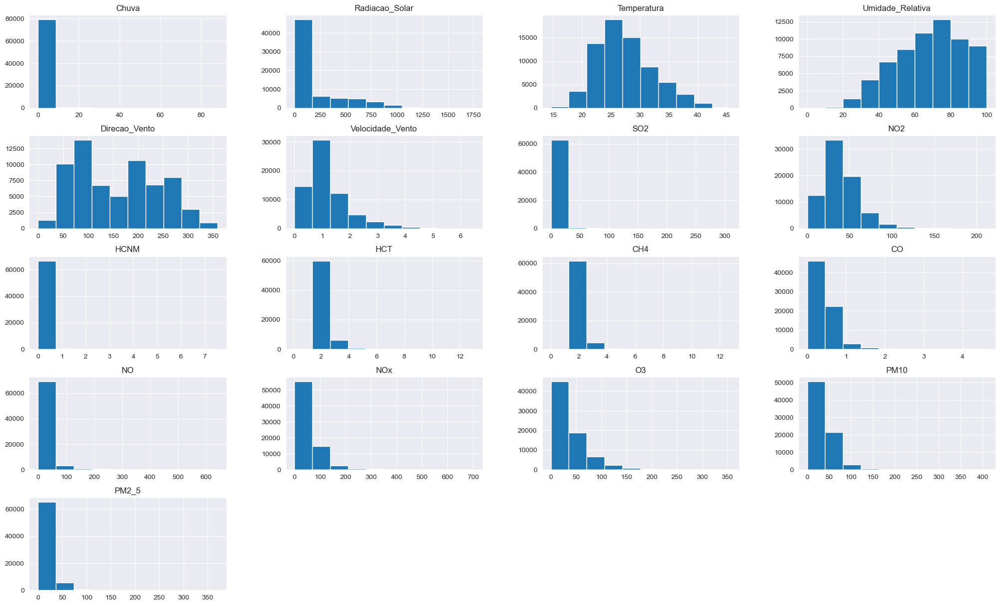

In [29]:
# Gráfico de Histograma dos dados 

dadoarIR_Medidas.hist(figsize = (25,15))
plt.show()

Sendo o histograma um gráfico que auxilia na visualização da distribuição de uma variável, através deste gráfico é possível verificar então que dentre as variáveis a Temperatura e a Umidade Relativa são as que apresentam uma distribuição mais aproximada de uma normal. Uma distribuição dita normal, é aquela que apresenta a maioria de seus valores próximos da média, ou uma maior concentração de valores em torno de sua média, sendo a média da UR igual a 68.33 medida em (%) e a média da Temperatura igual à 27.45 medida em (°C).

Os histogramas dos poluentes: Radiação Solar, HCT, CH4, CO, NOX, OX, PM10 e PM2.5 apresentam distribuição semelhante, com alta frequência de baixos valores, sendo classificada como uma distribuição assimétrica à direita. 

O histograma da Direção do Vento apresenta duas faixas de valores ou classes de alta frequência com uma maior concentração de valores. Se dividíssemos a série em classes, poderíamos ter duas classes em destaque, a primeira representando em torno de 23%, com os valores entre 70° e 110° e a segunda com valores entre 170 e 210 representando um percentual de 16,27%.

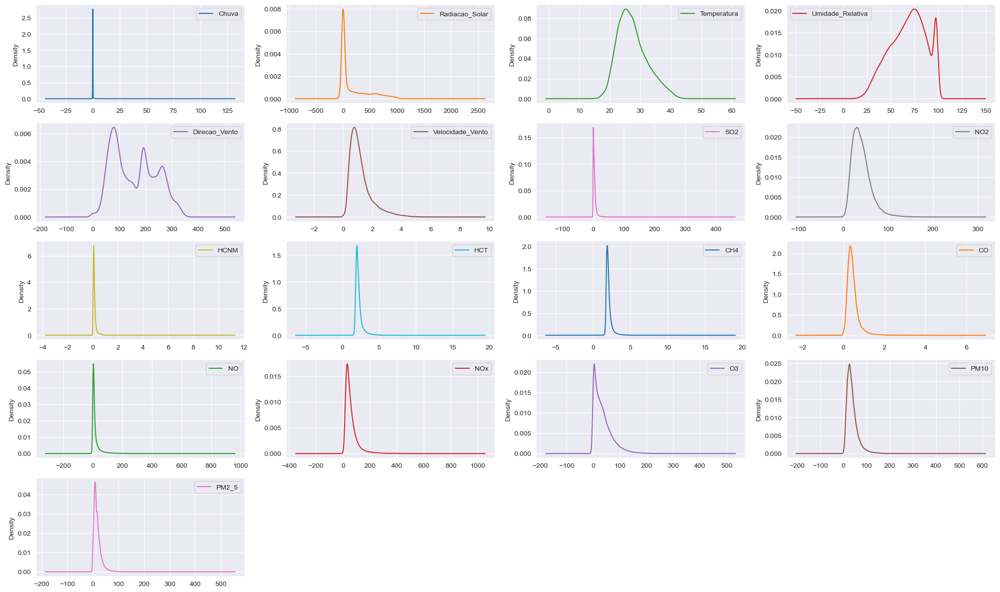

In [30]:
# Gráfico de densidade

dadoarIR_Medidas.plot(kind = 'density', subplots = True, layout = (5,4), sharex = False, figsize = (25,15))
plt.show()

Considerando que o gráfico de densidade consiste em um histograma suavizado, daí sua semelhança no formato com o gráfico anterior, ele nos permite observar os valores de densidade de probabilidade para as faixas de valores encontradas, representada pelo eixo y, cujos valores são maior ou igual à zero, ou positivos.

Os gráficos relativos à Chuva, Radiação Solar, SO2, HCNM, HCT, CH4, CO, NO e NOx apresentam maior probabilidade de ocorrerem para faixas de valores menores, o que não representa necessariamente um dado distoante, é dito isto porque, para a Chuva 97% dos valores medidos apresentaram menos de 1 mm, significa grande quantidade de medidas com baixos valores para o volume de Chuva, ou até mesmo sua não ocorrência.

Para o gráfico referente à Direção do Vento, verificamos mais de um valor representando maior densidade de probabilidade de ocorrência, este omportamento também é possível observar nos histogramas para a mesma variável. 

Dentre os gráficos de densidade de probabilidade destacam-se o gráfico relativo à Direção do Vento e à Umidade Relativa, pois estes apresentaram mais de uma faixa de valores com maiores densidade, assim estes são analisados a seguir.

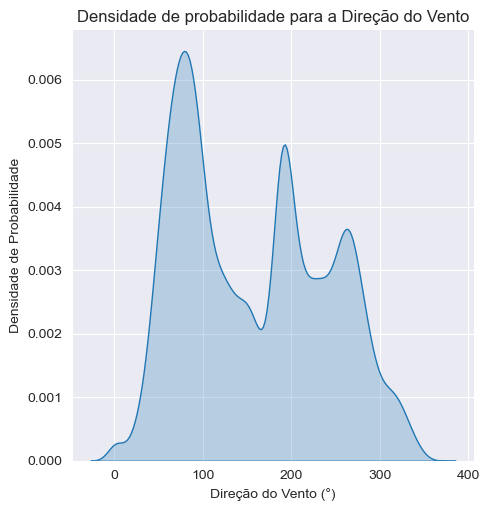

In [31]:
# Gráfico de densidade de probabilidade do volume de chuva

sns.displot(x="Direcao_Vento", kind = 'kde', bw_adjust = 1, fill = True, data = dadoarIR)
plt.title("Densidade de probabilidade para a Direção do Vento")
plt.xlabel("Direção do Vento (°)")
plt.ylabel("Densidade de Probabilidade");

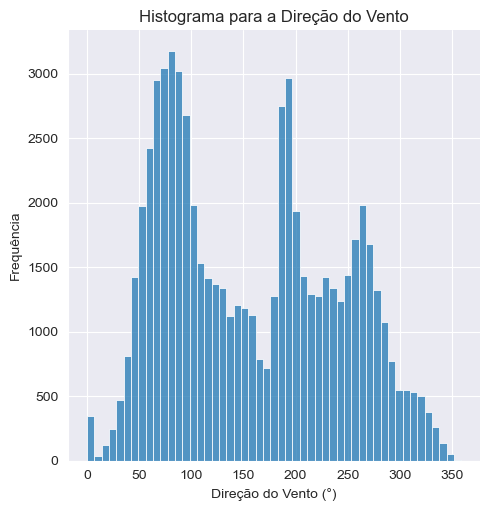

In [32]:
# Histograma para a Direção do Vento

sns.displot(x="Direcao_Vento", kind = 'hist', data = dadoarIR)
plt.title("Histograma para a Direção do Vento")
plt.xlabel("Direção do Vento (°)")
plt.ylabel("Frequência");

Para a análise do gráfico de densidade de probabilidade referente à Direção do Vento 3 faixas de valores destacam-se com maiores densidade, onde estas são melhor identificadas pelo gráfico de histograma. São elas: de 10 a 180° / de 180 a 220° / de 250 a 280° 

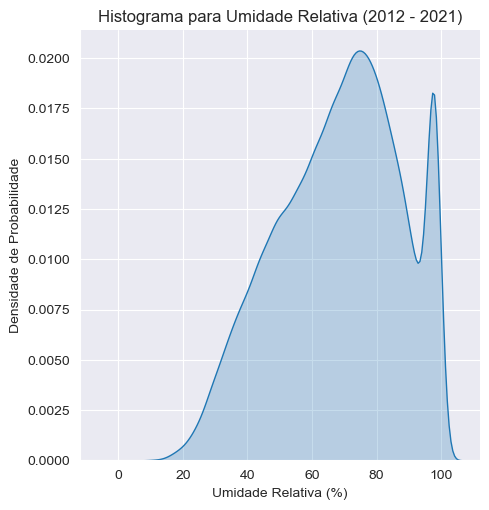

In [33]:
# Gráfico de densidade de probabilidade do volume de chuva

sns.displot(x="Umidade_Relativa", kind = 'kde', bw_adjust = 1, fill = True, data = dadoarIR)
plt.title("Histograma para Umidade Relativa (2012 - 2021)")
plt.xlabel("Umidade Relativa (%)")
plt.ylabel("Densidade de Probabilidade");

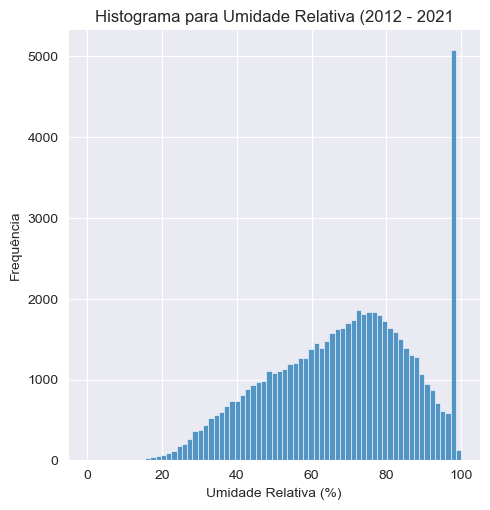

In [34]:
# Histograma para o Volume de Chuva

sns.displot(x="Umidade_Relativa", kind = 'hist', data = dadoarIR)
plt.title("Histograma para Umidade Relativa (2012 - 2021")
plt.xlabel("Umidade Relativa (%)")
plt.ylabel("Frequência");

Para a Umidade Relativa temos semelhante análise feita para a Direção do Vento, dado que para a UR são verificadas duas faixas de valores em destaque no que se refere a maior densidade de probabilidade de ocorrer, são elas com valor da UR de até 80% com probabilidade de 0.02 e para a faixa de 90 a 100% com densidade de probabilidade acima de 0.0175. 

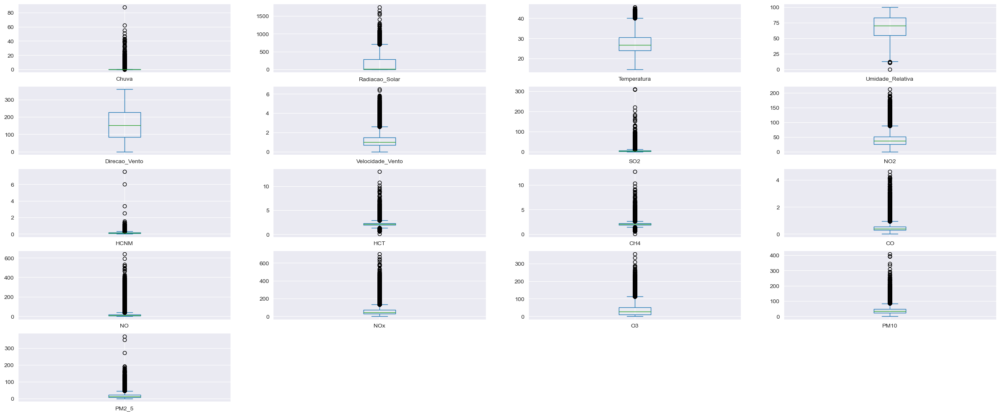

In [35]:
# Boxplot

dadoarIR_Medidas.plot(kind = 'box', subplots = True, layout = (10,4), sharex = False, sharey = False, figsize = (30,25))
plt.show()

O gráfico anterior boxplot apresenta a distribuição das variáveis considerando seus quartis, mediana e valores extremos ou *outliers*, na maioria dos gráficos observam-se muitos outiliers, ou seja, valores abaixo do limite inferior $LI = Q1 - 1.5 * IIQ$ e acima do limite superior $LS = Q3 + 1.5 * IIQ$, sendo $IIQ = Q3 - Q1$ o intervalo interquartílico, onde temos:

- $Q1$ Primeiro Quartil - 25% das observações encontram-se abaixo deste valor 
- $Q3$ Terceiro Quartil - 75% das observações encontram-se abaixo deste valor 

Assim apenas o gráfico boxplot relativo à Direção do Vento, não apresentou valores outiliers.

Outra observação que o boxplot permite realizar é em relação à dispersão dos dados, através do $IIQ$, onde quanto maior o valor do intervalo maior será a dispersão, assim a Umidade Relativa, a Temperatura e a Direção do Vento são os que apresentam as maiores dispersões.

Torna-se importante conhecer a dispersão, ou variabilidade dos dados e sua simetria, pois quanto mais assimétricos mais estes sofrem influência de valores extremos. Tal informação deve ser considerada quando no tratamento de valores ausentes, faz-se necessário escolher qual medida de posição deve ser utilizada de forma a não comprometer características que identifiquem o comportamento de determinada variável, daí ser de conhecimento que para dados assimétricos a medida de posição mais indicada para imputação é a mediana.

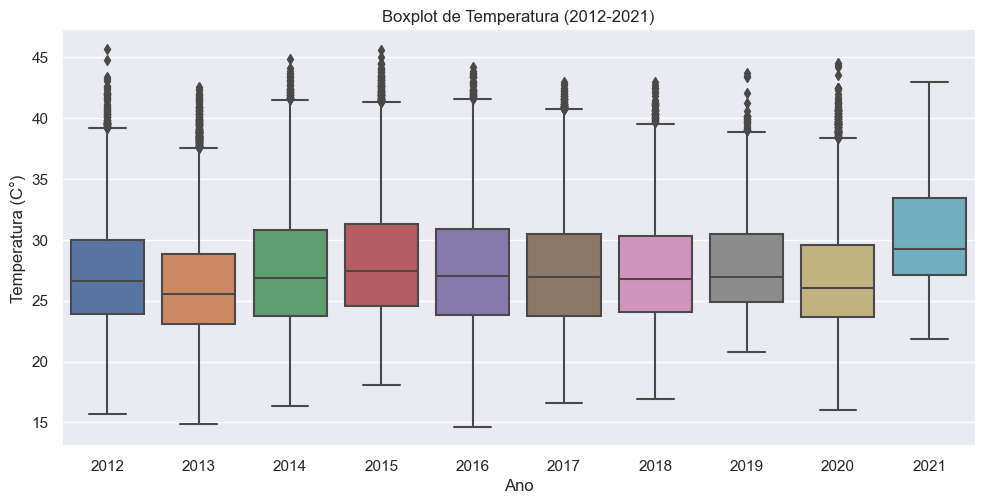

In [36]:
# Boxplot da temperatura por ano 

sns.set_theme()
sns.catplot(y="Temperatura", x="Ano", kind="box",  aspect = 2, data=dadoarIR)
plt.title("Boxplot de Temperatura (2012-2021)")
plt.ylabel("Temperatura (C°)")
plt.xlabel("Ano");

O gráfico boxplot para a Temperatura apresenta outiliers para todos os anos, exceto para 2021, distribuição simétrica para os anos de 2016 e 2017, pois a mediana aparce no centro do gráfico. Não assimétrica em 2019 e também para o ano de 2021.

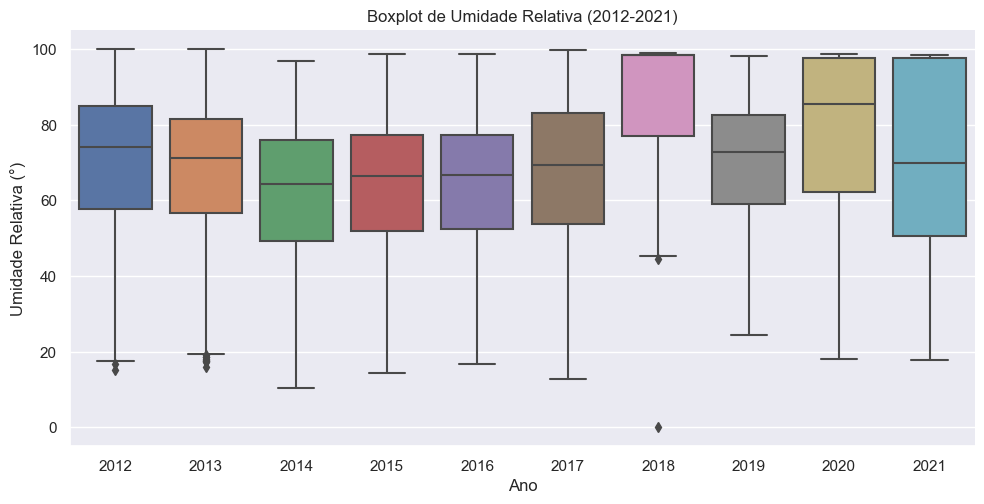

In [37]:
# Boxplot da umidade relativa por ano 

sns.set_theme()
sns.catplot(y="Umidade_Relativa", x = 'Ano', kind="box",  aspect = 2, data=dadoarIR)
plt.title("Boxplot de Umidade Relativa (2012-2021)")
plt.ylabel("Umidade Relativa (°)")
plt.xlabel("Ano");

O boxplot para a Umidade Relativa apresenta para os anos de 2018, 2020 e 2021 o 3º quartil muito próximo do Limite Superior, o que denota uma distribuição assimétrica, além disso o ano de 2018 apreesenta menor dispersão entre os dados pois possui menor distância entre o 3º e o 1º quartil, alem de apresentar valores outliers abaixo do Limite inferior.


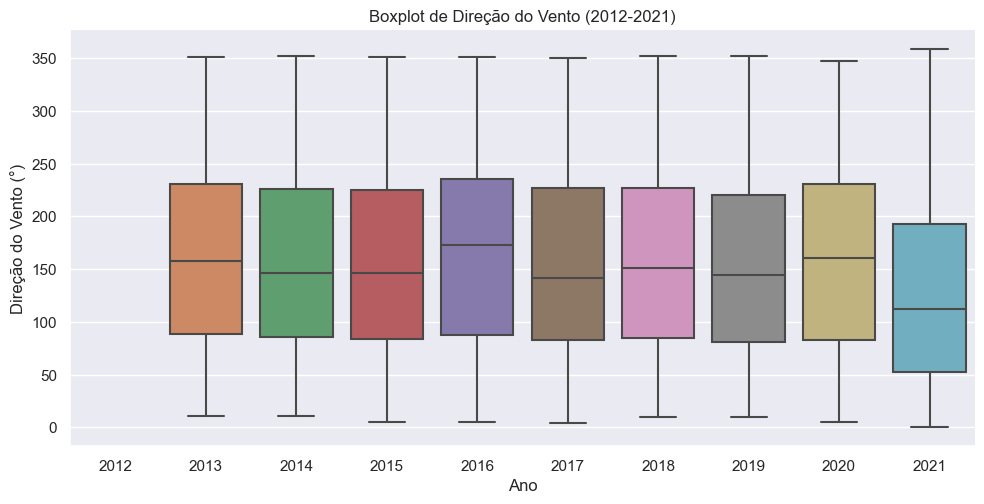

In [38]:
# Boxplot da temperatura por ano 

sns.set_theme()
sns.catplot(y="Direcao_Vento", x = 'Ano', kind="box",  aspect = 2, data=dadoarIR)
plt.title("Boxplot de Direção do Vento (2012-2021)")
plt.ylabel("Direção do Vento (°)")
plt.xlabel("Ano");

O gráfico de boxplot para a Direção do Vento não apresentou outlier, além de apresentar uma distribuição dos dados muito simétrica, podendo-se destacar o ano de 2016 onde através da mediana, ou 2º quartil, verifica-se mais de 50% dos valores encontrando-se acima de 150°.

Para o ano de 2021 apesar de mais de 50% dos valores estarem acima de 100°, esta é uma informação não comparável com os outros anos, devido este ano não ter todos os meses com medição para a Direção do Vento, esta condição será verificada mais à frente.

# ***4 - Análise Exploratória por poluente***

Nesta etapa estudamos o comportamento de alguns poluentes e fenômenos atmosféricos que influenciam na evolução de doenças respiratórias, assim inicialmente selecionou-se as variáveis de interesse em novo dataset denominado "dadarIR_grf", onde neste não foram incluídas as variáveis categóricas. Este dataset será o utilizado para a construção dos gráficos.

In [39]:
# Novo dataset dadoarIR_grf

dadoarIR_grf = dadoarIR[['Chuva','Radiacao_Solar','Temperatura','PM10','PM2_5','O3','NO2',
                         'CO','CH4','Ano','Mes','nmes','Data_dt','estacao_ano','periodo_dia']]

In [40]:
# Sumário estatístico para os atributos numéricos do banco com os poluentes 
# selecionados para uso na construção dos gráficos dadoarIR_grf

dadoarIR_grf.describe()

,Chuva,Radiacao_Solar,Temperatura,PM10,PM2_5,O3,NO2,CO,CH4,Ano,Mes
count,79394.000000,68397.000000,69942.000000,76108.000000,71421.000000,73722.000000,73931.000000,72352.000000,67061.000000,79863.000000,79863.00000
mean,0.134650,172.533981,27.448996,37.263661,17.317909,35.123128,39.718879,0.448970,2.079119,2016.148630,6.42201
std,1.218307,263.120389,4.865654,23.913806,14.699718,33.879136,20.668641,0.290624,0.399875,2.679367,3.48899
min,0.000000,0.000000,14.600000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,2012.000000,1.00000
25%,0.000000,0.000000,23.880000,22.000000,8.000000,9.150000,24.990000,0.280000,1.860000,2014.000000,3.00000
50%,0.000000,5.830000,26.750000,32.000000,13.000000,26.320000,36.320000,0.390000,1.980000,2016.000000,6.00000
75%,0.000000,283.000000,30.370000,47.000000,23.000000,50.490000,50.150000,0.540000,2.170000,2018.000000,9.00000
max,88.000000,1752.670000,45.650000,409.000000,370.000000,355.450000,211.810000,4.620000,12.730000,2021.000000,12.00000


In [41]:
# Verificando a estrutura do banco dadoarIR_grf

print(dadoarIR_grf)

       Chuva  Radiacao_Solar  Temperatura  PM10  PM2_5     O3    NO2    CO  \
0        0.8            0.83        24.84  89.0   85.0  25.03  20.09  0.40   
1        0.0            1.00        24.68  33.0   32.0  22.95  18.91  0.35   
2        0.0            1.00        24.56  19.0   14.0  22.31  17.99  0.34   
3        0.0            1.00        24.65  12.0   12.0  17.98  22.49  0.37   
4        0.0            1.00        24.66  10.0   10.0  18.88  21.28  0.32   
...      ...             ...          ...   ...    ...    ...    ...   ...   
79858    0.0            6.00        26.98  29.0    0.0  17.04  30.38   NaN   
79859    0.0            6.17        26.82  28.0    2.0  18.76  28.38   NaN   
79860    0.0            6.00        26.70  26.0    7.0  21.30  24.53   NaN   
79861    1.8            6.00        25.80  30.0   11.0  17.11  28.75   NaN   
79862    0.2            7.00        23.40  43.0   20.0  12.21  33.24   NaN   

        CH4   Ano  Mes     nmes    Data_dt estacao_ano periodo_

A seguir é feita análise exploratória por poluente com intuito de verificar no período dos anos de 2012 a 2021 as falhas ocorridas nas medições da estação. A identificação da falha e de quando ocorreu permite o monitoramento dos equipamentos usados na estação.

Outro objetivo é compreender o comportamento, seja na evolução ou diminuição da emissão dos poluentes e da ocorrência dos fenômenos atmosféricos no período em análise.

## 4.1 - Visualizações Unimodais

### 4.1.1 - Chuva

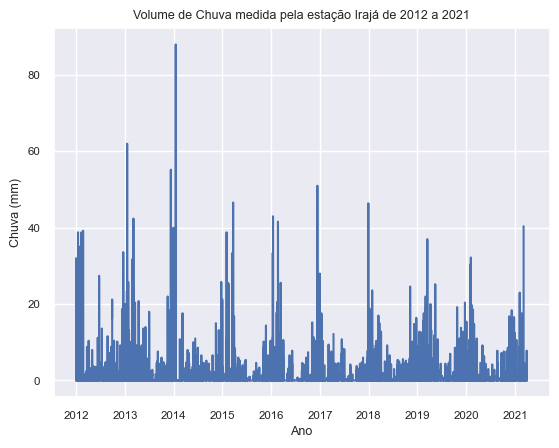

In [42]:
# Gráfico de linhas da série histórica do volume de chuva

sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.75) 
plt.ylabel("Chuva (mm)")
plt.xlabel("Ano")
plt.plot(dadoarIR['Data'], dadoarIR_grf['Chuva']);
plt.title('Volume de Chuva medida pela estação Irajá de 2012 a 2021');

No gráfico de linhas acima onde temos o volume de chuva medido pela estação Irajá, observamos no ano de 2014 um aumento significativo de chuva distoando dos outros anos da série, este aumento ocorre perante a presença de valores outliers nos dados de 2014, assim torna-se interessante verificar sua ocorrência em quais períodos do ano.

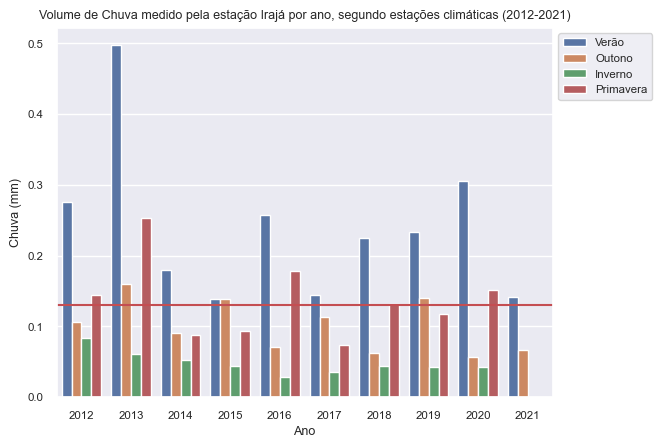

In [43]:
# Gráfico de barras referente à Chuva

gfg = sns.barplot(x = "Ano", y = "Chuva", hue = "estacao_ano", data = dadoarIR_grf, errorbar=None);
plt.axhline(y=0.13, color='r', linestyle='-')
plt.title("Volume de Chuva medido pela estação Irajá por ano, segundo estações climáticas (2012-2021)")
plt.ylabel("Chuva (mm)")
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.show();

Quando olhamos o gráfico de barras acima, referente aos anos segundo as estações climáticas, temos agora, não mais no ano de 2014, mas no verão de 2013 onde o volume de chuva apresentou um aumento de aproximadamente 5 vezes maior que a média de 0.13mm observada em toda a série , onde esta média geral é representada pela linha em cor vermelha. 

Em toda a série os maiores volumes de chuva ocorreram no verão seguido da primavera que com alto volume também no ano de 2013.

O gráfico de barras mostra que nas estações climáticas de Outono e Inverno de 2021 não ocorreram medições, o que significa algum problema na estação para a medição do volume de chuva no período.

O gráfico de barras ilustra as estações do ano onde foram observadas consideráveis volumes de chuvas acima da média. Diferente do gráfico de linhas, neste a estação do ano verão de 2013 se destaca, o que é sempre esperado nesta estação do ano, como é verificado nos outros anos e confirmando o esperado segundo os profissionais de estudos meteorológicos. 



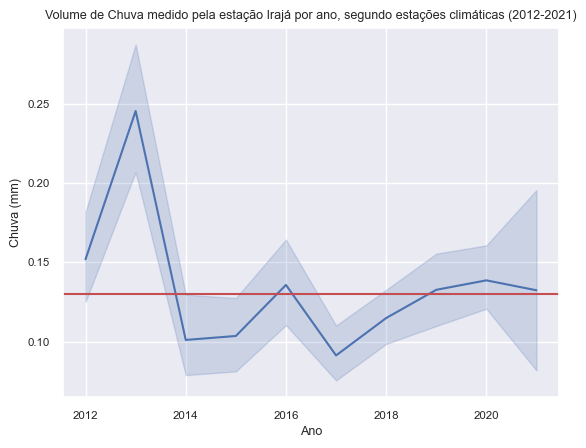

In [44]:
# Gráfico de linhas 

sns.lineplot(x='Ano', y='Chuva', data = dadoarIR_grf)
plt.title("Volume de Chuva medido pela estação Irajá por ano, segundo estações climáticas (2012-2021)")
plt.ylabel("Chuva (mm)")
plt.axhline(y=0.13, color='r', linestyle='-');

O gráfico de linhas confirma o ano de 2013 como sendo o primeiro em maior volume de chuva nos anos da análise.

Verificando o aumento considerável de chuva nos verões de 2013 e 2020, vale a investigação sobre em quais meses este aumento ocorreu, assim é feita uma seleção apenas para os anos de 2013 e 2020 salvando os dados selecionados no dataset "dadoarIR_2013e2020".

In [45]:
# Selecionando no banco dadoarIR_grf os Anos de 2013 e 2020

dadoarIR_2013e2020 = dadoarIR_grf[['Chuva','Ano','estacao_ano','Mes', 'nmes']]
dadoarIR_2013e2020 = dadoarIR_2013e2020.loc[ ( dadoarIR_grf ['Ano'] == 2013) | ( dadoarIR_grf ['Ano'] == 2020) ]  

In [46]:
# Exibindo os dados selecionados dos anos de 2013 e 2020 e verificando do banco 
# dadoarIR_2013e2020

dadoarIR_2013e2020

,Chuva,Ano,estacao_ano,Mes,nmes
8759,0.0,2013,Verão,1,Janeiro
8760,0.0,2013,Verão,1,Janeiro
8761,0.0,2013,Verão,1,Janeiro
8762,0.0,2013,Verão,1,Janeiro
8763,0.0,2013,Verão,1,Janeiro
...,...,...,...,...,...
77714,3.8,2020,Verão,12,Dezembro
77715,0.2,2020,Verão,12,Dezembro
77716,1.0,2020,Verão,12,Dezembro
77717,0.0,2020,Verão,12,Dezembro


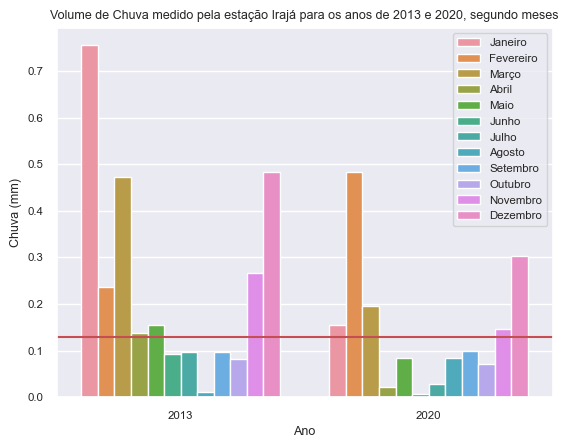

In [47]:
# Gráfico de barras referente à Chuva

gfg = sns.barplot(x = "Ano", y = "Chuva", hue = "nmes", data = dadoarIR_2013e2020, errorbar=None);
plt.axhline(y=0.13, color='r', linestyle='-')
plt.title("Volume de Chuva medido pela estação Irajá para os anos de 2013 e 2020, segundo meses")
plt.ylabel("Chuva (mm)")
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.show();

O gráfico de barras acima apresenta o volume de chuva nos anos de 2013 e 2020 segundo os meses, bam como a média de 0.13 mm na série verficada pelo resumo estatístico, representada pela linha em vermelho.   

Podemos observar nos três primeiros meses e nos dois últimos de 2013, que pertencem à estação do verão, volumes muito acima da média do período.

No ano de 2020 é verificado também nos três primeiros meses, porém neste ano com destaque para o mês de fervereiro seguido de dezembro. 

Outro comportamento que o gráfico chama a atenção é para o mês de agosto de 2013 e junho de 2020, onde para os 2 anos, foi apresentada a baixa quantidade de chuva nos meses.

### 4.1.2 - Temperatura

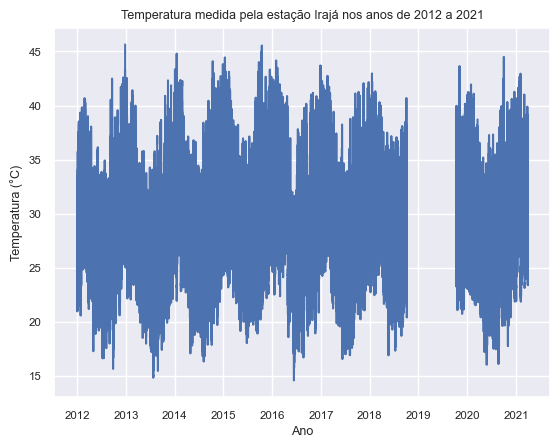

In [48]:
# Gráfico de linhas da série histórica de temperatura, foi usado o dataset
# "dadoarIR" por este possuir o atributo Data

sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.75) 
plt.ylabel("Temperatura (°C)")
plt.xlabel("Ano")
plt.plot(dadoarIR['Data'], dadoarIR['Temperatura']);
plt.title('Temperatura medida pela estação Irajá nos anos de 2012 a 2021');

Pelo gráfico de linhas de série verificamos no ano de 2013 um valor acima de 45°C, o mesmo ocorreu em 2015. Outra situação que é apresentada pelo gráfico é a não medição da temperatura em um grande período de 2019, daí ser interessante um gráfico que identifique a ocorrência de chuva nos meses de 2019.

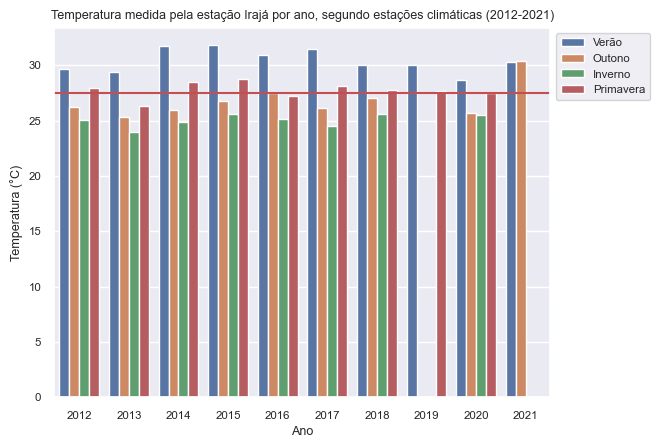

In [49]:
# Gráfico de barras referente à Temperatura

gfg = sns.barplot(x = "Ano", y = "Temperatura", hue = "estacao_ano", data = dadoarIR_grf, errorbar=None);
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.axhline(y=27.44, color='r', linestyle='-')
plt.title("Temperatura medida pela estação Irajá por ano, segundo estações climáticas (2012-2021)")
plt.xlabel("Ano")
plt.ylabel("Temperatura (°C)")
plt.show();

No gráfico de barras acima, a temperatura ao longo da série apresentou alta no verão o que é esperado, porém, no ano de 2021 a temperatura se mostrou alta também no outono com valor de 41,28°C, comportamento que não é considerado normal no outono.

A temperatura média apresentada na série foi de 27,36°C, sendo representada pelo linha em cor vermelha, permite verificar que a temperatura do outono do ano de 2021 próxima de 30°C superou a média do período. O gráfico também demonstra alta acima da média nos verões de 2014 e 2015.

Neste gráfico também é posível identificar a não medição do volume de chuva no outono e inverno de 2019, e ocorrida no ano de 2021 somente até o outono de 2021. Vale reforçar tal observação ser de interesse do estudo.

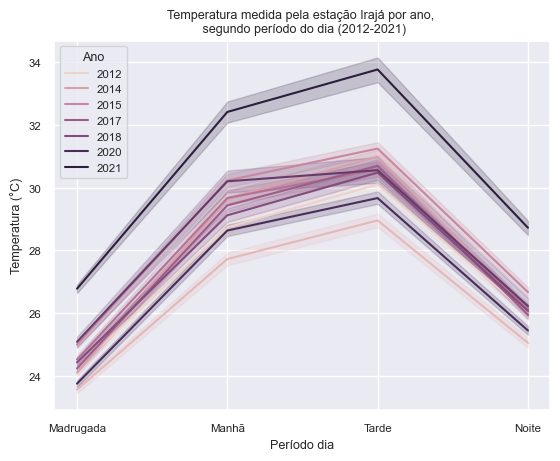

In [50]:
# Gráfico de linha da variação da temperatura ao longo do dia

sns.lineplot(
    data=pd.DataFrame(dadoarIR_grf), 
    x="periodo_dia", y="Temperatura", hue="Ano",    
    sort=True
)
plt.title("Temperatura medida pela estação Irajá por ano, \n segundo período do dia (2012-2021)")
plt.xlabel("Período dia")
plt.ylabel("Temperatura (°C)");

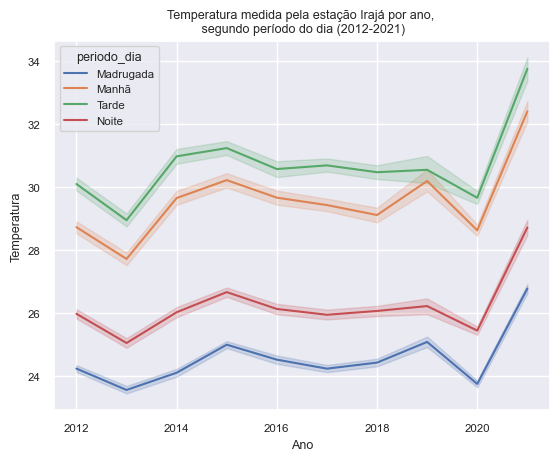

In [51]:
# Gráfico de linha da Temperatura

plt.title("Temperatura medida pela estação Irajá por ano, \n segundo período do dia (2012-2021)")
sns.lineplot(data=dadoarIR_grf, x="Ano", y="Temperatura", hue="periodo_dia");


Os gráficos de linha anteriores apresentam a informação que aparenta ser óbvia, pois neles confirmamos o comportamento da tempertura ao longo do dia, na série em todos os anos tal comportamento é observado, com maiores valores de temperaturas na parte da manhã e tarde e menores à noite e na madrugada.

Aparentemente o ano de 2021 se destaca aparentando um comportamento diferente dos anos anteriores, porém este ano possui informação apenas para o primeiro trimestre do ano, não sendo adequada uma comparação de 2021 com os outros anos da série.



In [52]:
# Selecionando no banco dadoarIR_grf ano de 2021

dadoarIR_2021 = dadoarIR_grf[['Temperatura','Ano','estacao_ano','Mes', 'nmes']]
dadoarIR_2021 = dadoarIR_2021.loc[ ( dadoarIR_grf ['Ano'] == 2021) ]  

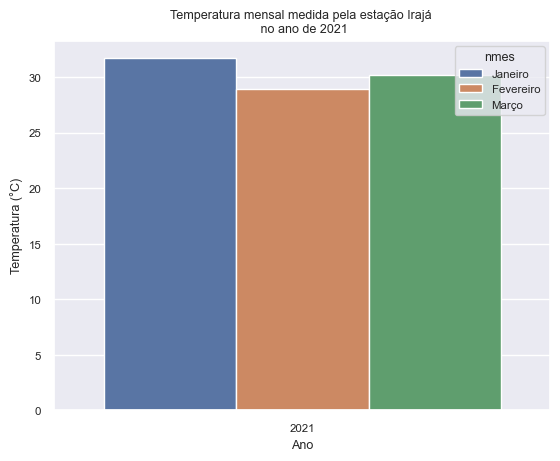

In [53]:
# Gráfico de linha de temperatura

sns.barplot(x = "Ano", y = "Temperatura", hue = "nmes", data = dadoarIR_2021, errorbar=None);
plt.title("Temperatura mensal medida pela estação Irajá \n no ano de 2021")
plt.xlabel("Ano")
plt.ylabel("Temperatura (°C)");

O gráfico de barras acima com as temperaturas medidas no ano de 2021, possibilitou verificar que as medidas ocorreram apenas para os 3 primeiros meses, com destaque para os meses de janeiro e março, com maiores temperaturas.

### 4.1.3 - Radiação Solar

A Radiação Solar (RS) que representa o fluxo de energia solar nos anos de 2012 e 2016 apresentou valores muito acima dos valores típicos demonstrado nos outros anos, porém quando tais valores são comparados com a média dos anos no valor de 173, nos períodos das estações do ano, não encontramos situação fora da normalidade, já que os valores maiores ocorreram no verão e na primavera.  

No monitoramento do trabalho da estação para a medição de RS, períodos nos anos de 2013,2014 e 2019 demonstraram ausência de medição.

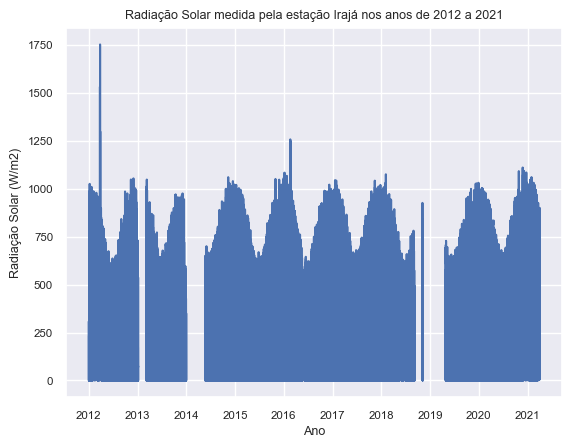

In [54]:
# Gráfico de linhas da série medida de Radiação Solar

sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.75) 
plt.ylabel("Radiação Solar (W/m2)")
plt.xlabel("Ano")
plt.plot(dadoarIR['Data'], dadoarIR_grf['Radiacao_Solar']);
plt.title('Radiação Solar medida pela estação Irajá nos anos de 2012 a 2021');

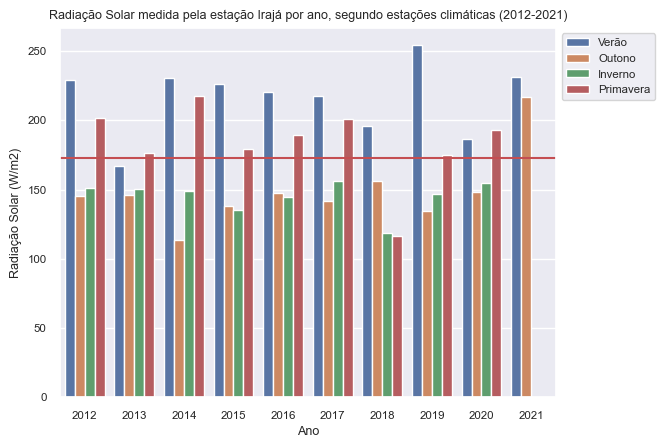

In [55]:
# Gráfico de barras referente à Radiação Solar

gfg = sns.barplot(x = "Ano", y = "Radiacao_Solar", hue = "estacao_ano", data = dadoarIR_grf, errorbar=None);
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.axhline(y=172.5, color='r', linestyle='-')
plt.title("Radiação Solar medida pela estação Irajá por ano, segundo estações climáticas (2012-2021)")
plt.xlabel("Ano")
plt.ylabel("Radiação Solar (W/m2)")
plt.show();

O gráfico de barras não ajuda na investigação para detectar em qual mês de determinado ano, não ocorreu medição de RS, daí a necessidade de um gráfico que permita descriminar as medições por mês nos anos. Assim separamos os anos de 2013, 2014, 2018 e 2019 para os dados de RS.

O gráfico seguinte aparenta ter grandes "buracos", quantidade de valores ausentes nos anos de 2013, 2014, 2018 e 2019, porém com o gráfico seguinte de barras horizontais é possível confirmarmos no ano de 2013 a ausência de medição para o mês de fevereiro, para o ano de 2014 ausência nos meses de janeiro à abril, para o mês de 2018 ausência nos meses de outubro e dezembro e para o ano de 2019 ausência para os meses de janeiro à março.

In [56]:
# selecionando dataset para os Anos de 2013,2014,2018 e 2019 com as medições de Radiação Solar

Ano2013_RS = dadoarIR_grf.query('Ano == 2013')[['Radiacao_Solar','Ano','estacao_ano','Mes', 'nmes']]
Ano2014_RS = dadoarIR_grf.query('Ano == 2014')[['Radiacao_Solar','Ano','estacao_ano','Mes', 'nmes']]
Ano2018_RS = dadoarIR_grf.query('Ano == 2018')[['Radiacao_Solar','Ano','estacao_ano','Mes', 'nmes']]
Ano2019_RS = dadoarIR_grf.query('Ano == 2019')[['Radiacao_Solar','Ano','estacao_ano','Mes', 'nmes']]


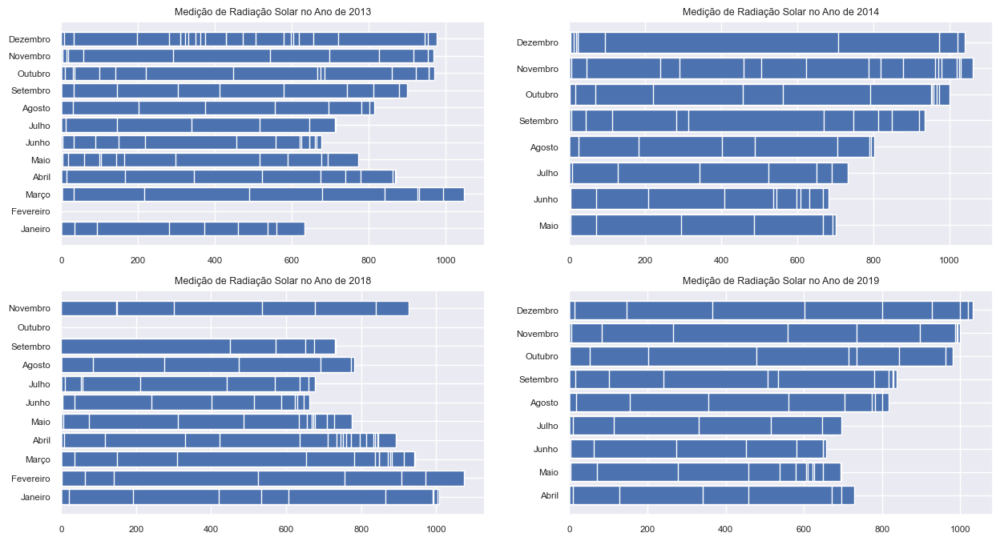

In [57]:
# configurando um grupo de subplots em um grid de 1 linha e 2 colunas
# e também o tamanho da figura

fig, ax = plt.subplots(2,2, figsize = (15, 8))

# subplot1: bar horizontal do comprimento_sepala
ax[0,0].barh(Ano2013_RS.nmes, Ano2013_RS.Radiacao_Solar)
ax[0,0].set_title("Medição de Radiação Solar no Ano de 2013")

# subplot2: bar horizontal da largura_sepala
ax[0,1].barh(Ano2014_RS.nmes, Ano2014_RS.Radiacao_Solar)
ax[0,1].set_title("Medição de Radiação Solar no Ano de 2014")

# subplot3: bar horizontal do comprimento_petala
ax[1,0].barh(Ano2018_RS.nmes, Ano2018_RS.Radiacao_Solar)
ax[1,0].set_title("Medição de Radiação Solar no Ano de 2018")

# subplot4: bar horizontal da largura_petala
ax[1,1].barh(Ano2019_RS.nmes, Ano2019_RS.Radiacao_Solar)
ax[1,1].set_title("Medição de Radiação Solar no Ano de 2019");

### 4.1.4 - PM10 e PM2.5

Em relação aos materiais particulados PM10 e PM2.5, sua exposição de longo ou curto prazo pode estar diretamente ligadas ao surgimento de doenças respiratórias e cardiovasculares, daí sua importância no estudo de poluentes atmosféricos e sua relação com a saúde. Ao meio ambiente a alta emissão destes poluentes podem trazer alteração dos nutrientes de lagos, rios, solos e na diversidade do ecossistema, bem como danificação da vegetação, daí sua relevância quando se analisa a qualidade do ar que respiramos.

#### 4.1.4.1 - PM10

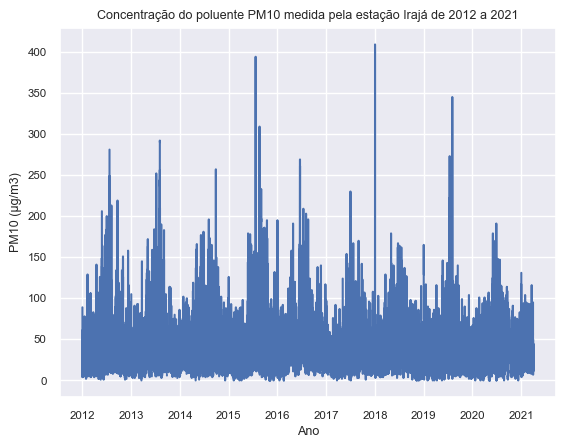

In [58]:
# Gráfico de linhas da série histórica do poluente PM10

sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.75) 
plt.ylabel("PM10 (µg/m3)")
plt.xlabel("Ano")
plt.plot(dadoarIR['Data'], dadoarIR_grf['PM10'])
plt.title('Concentração do poluente PM10 medida pela estação Irajá de 2012 a 2021');

O gráfico de linhas acima mostra as medições relativas ao poluentes PM10, não apresentando dados ausentes, sugerindo que para este poluente a estação não apresentou problemas no período.

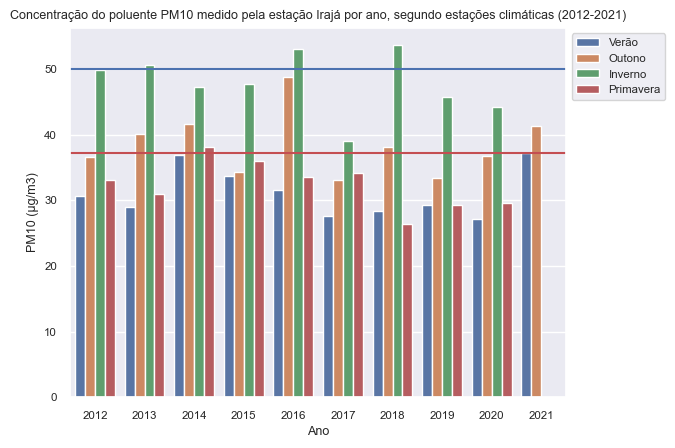

In [59]:
# Gráfico de barras referente à PM10

gfg = sns.barplot(x = "Ano", y = "PM10", hue = "estacao_ano", data = dadoarIR_grf, errorbar=None);
plt.axhline(y=37.26, color='r', linestyle='-')
plt.axhline(y=50, color='b', linestyle='-')
plt.title("Concentração do poluente PM10 medido pela estação Irajá por ano, segundo estações climáticas (2012-2021)")
plt.ylabel("PM10 (µg/m3)")
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.show();

O poluentes PM10 segundo o gráfico de linha acima, apresenta valores altos de emissão ocorridos na estação do outono e principalmente na estação do inverno para todos os anos. 

Interessante observarmos a linha em vermelho que representa o valor médio de 37.26 µg/m3 do perído em análise.

Outra observação relevante verificamos no inverno do ano de 2016 e do ano de 2018, pois estes ultrapassaram a diretriz da OMS para curta exposição de 50 μg/m3.

In [60]:
# Selecionando no banco dadoarIR_grf os Anos de 2016 e 2018

dadoarIR_2016e2018 = dadoarIR_grf[['PM10','Ano','estacao_ano','Mes', 'nmes']]
dadoarIR_2016e2018 = dadoarIR_2016e2018.loc[ ( dadoarIR_grf ['Ano'] == 2016) | ( dadoarIR_grf ['Ano'] == 2018) ]  

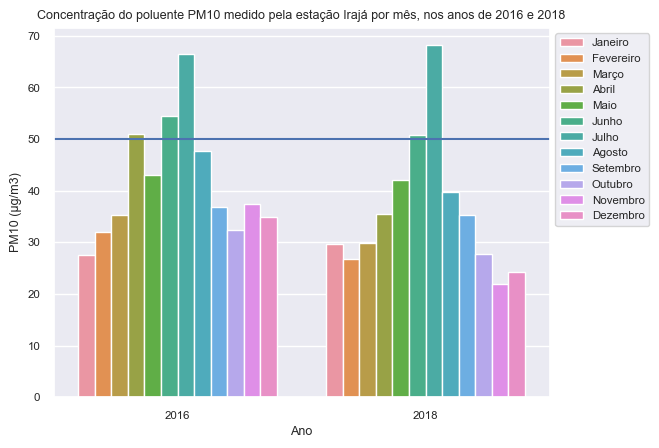

In [61]:
# Gráfico de barras referente à Chuva

gfg = sns.barplot(x = "Ano", y = "PM10", hue = "nmes", data = dadoarIR_2016e2018, errorbar=None);
plt.axhline(y=50, color='b', linestyle='-')
plt.title("Concentração do poluente PM10 medido pela estação Irajá por mês, nos anos de 2016 e 2018")
plt.ylabel("PM10 (µg/m3)")
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.show();

Através do dataset "dadoarIR_2016e2018" é possível verificar em quais meses dos anos de 2016 e de 2018, ocorreram maior concentração do poluente PM10, sendo para o ano de 2016 ocorrido nos meses de abril, junho e julho, e para o ano de 2018 nos meses de junho e julho.

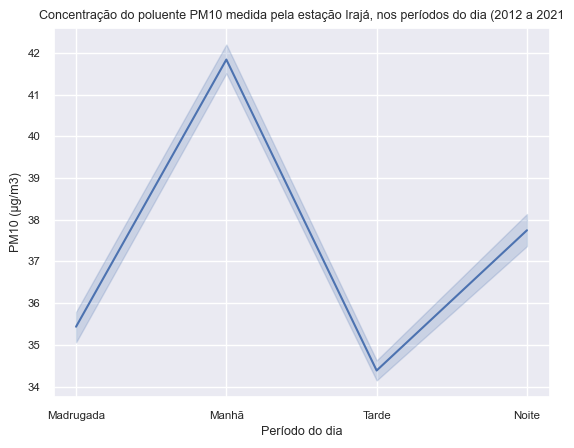

In [62]:
# Gráfico de linhas 

sns.lineplot(x='periodo_dia', y='PM10', data = dadoarIR_grf)
plt.title('Concentração do poluente PM10 medida pela estação Irajá, nos períodos do dia (2012 a 2021')
plt.xlabel("Período do dia")
plt.ylabel("PM10 (µg/m3)");

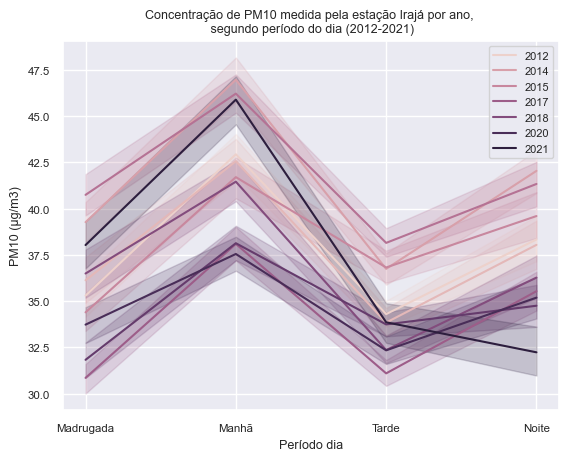

In [63]:
# Gráfico de linha da concentração de PM10 ao longo do dia

sns.lineplot(
    data=pd.DataFrame(dadoarIR_grf), 
    x="periodo_dia", y="PM10", hue="Ano",    
    sort=True
)
plt.title("Concentração de PM10 medida pela estação Irajá por ano, \n segundo período do dia (2012-2021)")
plt.xlabel("Período dia")
plt.ylabel("PM10 (µg/m3)")
plt.legend(fontsize=8);

A análise a respeito da concentração do ar em relação ao poluente PM10, apresenta informação de maior valor no horário da manhã o que a literatura confirma justificando esta relação com a poluição pela circulação de veículos, cujo aumento se verifica neste horário, principalmente em centros urbanos, fato confirmado pelos gráficos de linha acima descritos. 

#### 4.1.4.2 - PM2.5

O conhecimento sobre a concentração do poluente material particulado PM2.5 é de grande importância em função de suas consequências quando o ser humano encontra-se em sua longa exposição, podendo afetar o sistema cardiovascular, os pulmões e inclusive trazer problemas vasculares com possibilidade de um acidente vascular cerebral (AVC). Daí sua importância no estudo sobre a qualidade do ar.


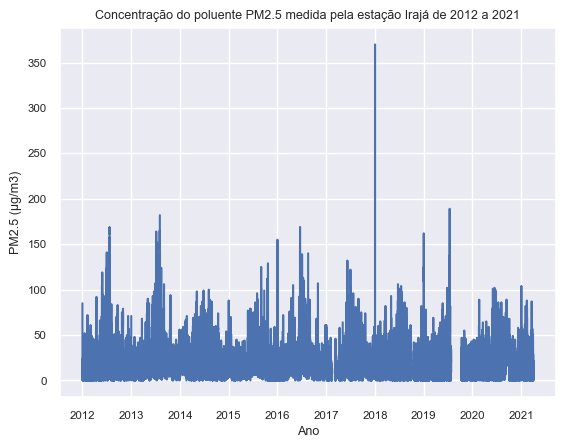

In [64]:
# Gráfico de linhas da série histórica do poluente PM2.5

sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.75) 
plt.ylabel("PM2.5 (µg/m3)")
plt.xlabel("Ano")
plt.plot(dadoarIR['Data'], dadoarIR_grf['PM2_5'])
plt.title('Concentração do poluente PM2.5 medida pela estação Irajá de 2012 a 2021');

O gráfico acima aponta alta concentração do PM2.5 em algum momento no ano de 2018, relevante para investigação do período do ano em que se verificou tal situação. 

Outro ponto de interesse no trabalho, diz respeito à questão de ausência de informação no ano de 2019, aparentando ter ocorrido algum problema no equipamento de medição da estação em algum momento de 2019.

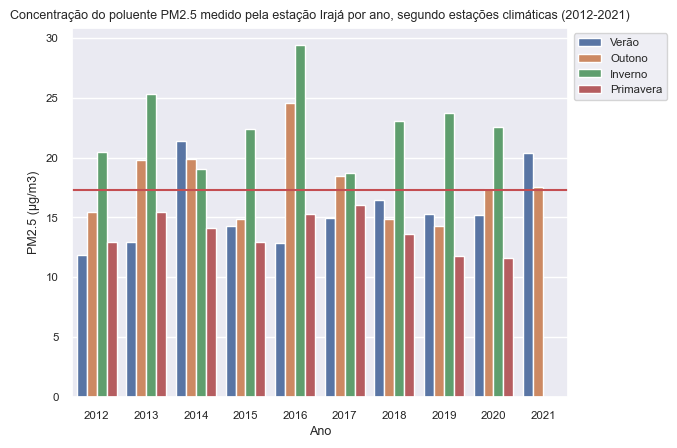

In [65]:
# Gráfico de barras referente à PM2.5

gfg = sns.barplot(x = "Ano", y = "PM2_5", hue = "estacao_ano", data = dadoarIR_grf, errorbar=None);
plt.axhline(y=17.32, color='r', linestyle='-')
plt.title("Concentração do poluente PM2.5 medido pela estação Irajá por ano, segundo estações climáticas (2012-2021)")
plt.ylabel("PM2.5 (µg/m3)")
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.show();

O gráfico de barras anterior demonstra em todos os anos um aumento significativo da concentração do poluente PM2.5 principalmente na estação do inverno e em alguns anos 2013, 2014, 206 e 2017 sua alta concentração também se verifica na estação do outono, porém é relevante seu aumento no verão de 2014, sendo assim o ano onde ocorreu por maior período a exposição ao poluente. 

O gráfico sugere investigar a ocorrência de doenças respiratórias nestes períodos e anos, afim de verificar alguma correlação entre estas e o poluente PM2.5.

In [66]:
# Selecionando no banco dadoarIR_grf os Anos de 2013 e 2020 

dadoarIR_2013_2019 = dadoarIR_grf[['PM2_5','Ano','estacao_ano','Mes', 'nmes']]
dadoarIR_2013_2019 = dadoarIR_2013_2019.loc[ ( dadoarIR_grf ['Ano'] == 2013) | ( dadoarIR_grf ['Ano'] == 2014) | 
                                             ( dadoarIR_grf ['Ano'] == 2016) | ( dadoarIR_grf ['Ano'] == 2018) | 
                                             ( dadoarIR_grf ['Ano'] == 2019)] 

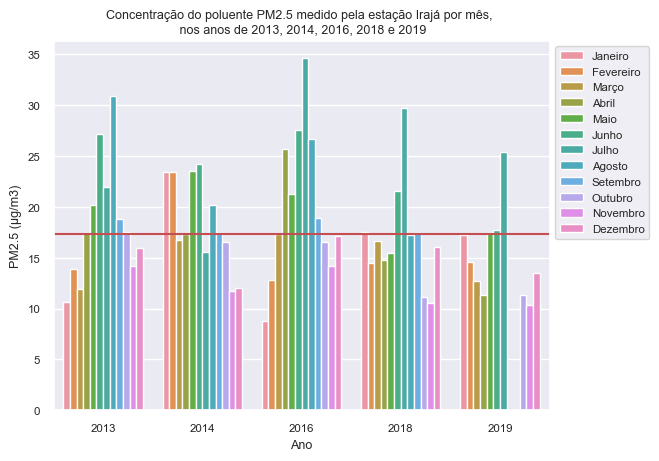

In [67]:
# Gráfico de barras referente ao PM2.5

gfg = sns.barplot(x = "Ano", y = "PM2_5", hue = "nmes", data = dadoarIR_2013_2019, errorbar=None);
plt.axhline(y=17.32, color='r', linestyle='-')
plt.title("Concentração do poluente PM2.5 medido pela estação Irajá por mês, \n nos anos de 2013, 2014, 2016, 2018 e 2019")
plt.ylabel("PM2.5 (µg/m3)")
gfg.legend(fontsize = 4.5)
gfg.legend(bbox_to_anchor = (1,1))
plt.show();

Em todos os anos observados no gráfico de barras acima, são verificados o período referente aos meses de maio à agosto, porém no ano de 2014, temos um comportamento distoando dos demais, são os meses de janeiro e fevereiro de 2014, nestes a conventração do poluente ultrapassou a média da concentração no valor de 17.32 µg/m3. 

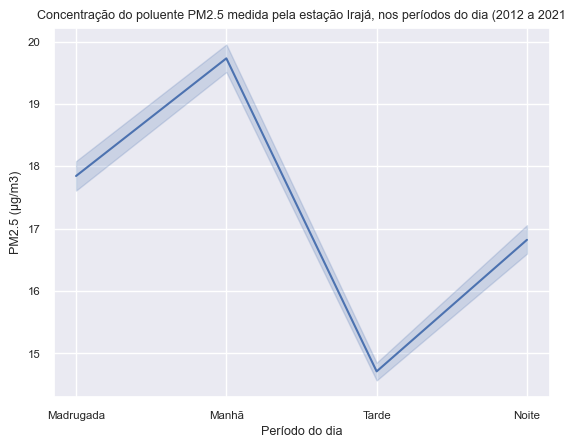

In [68]:
# Gráfico de linhas 

sns.lineplot(x='periodo_dia', y='PM2_5', data = dadoarIR_grf)
plt.title('Concentração do poluente PM2.5 medida pela estação Irajá, nos períodos do dia (2012 a 2021')
plt.xlabel("Período do dia")
plt.ylabel("PM2.5 (µg/m3)");

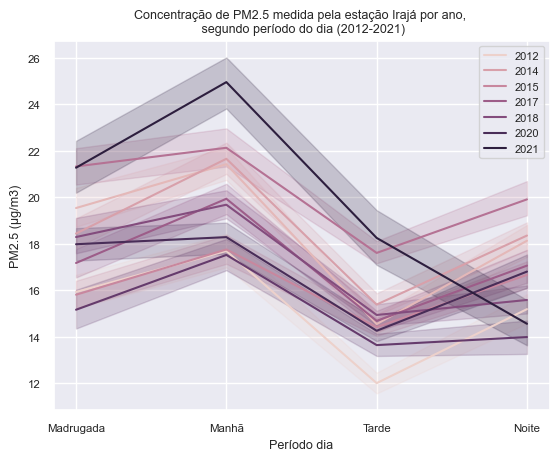

In [69]:
# Gráfico de linha da concentração de PM2.5 ao longo do dia

sns.lineplot(
    data=pd.DataFrame(dadoarIR_grf), 
    x="periodo_dia", y="PM2_5", hue="Ano",    
    sort=True
)
plt.title("Concentração de PM2.5 medida pela estação Irajá por ano, \n segundo período do dia (2012-2021)")
plt.xlabel("Período dia")
plt.ylabel("PM2.5 (µg/m3)")
plt.legend(fontsize=8);

Seguindo o comportamento do poluente material particulado PM10, o PM2.5 também apresenta alta de concentração no período da manhã do dia, por serem poluentes que possuem constituição semelhante a causa de sua conentração no período ocorre pelo mesmo motivo, informado pela literatura, sobre o aumento de sua concentração ocorrer quando diante de grande fluxo de veículos, em função dos gases emitidos por estes.

### 4.1.5 - Ozônio (O3)

São muitas as consequências para a saúde humana, estudos revelam que a longa exposição ao poluente O3, além da possibilidade de resultar em problemas de pele e olhos verifica-se a possibilidade no agravamento de doenças respiratórias como a asma. Também pode ser danoso para o sistema imunológico, podendo inclusive causar danos de natureza genética no DNA. 

Segundo a literatura o Ozônio é considerado um poluente secundário, ou seja, não é emitido por uma fonte direta, porém sua ocorrência é em função de reações químicas à partir de outros poluentes.

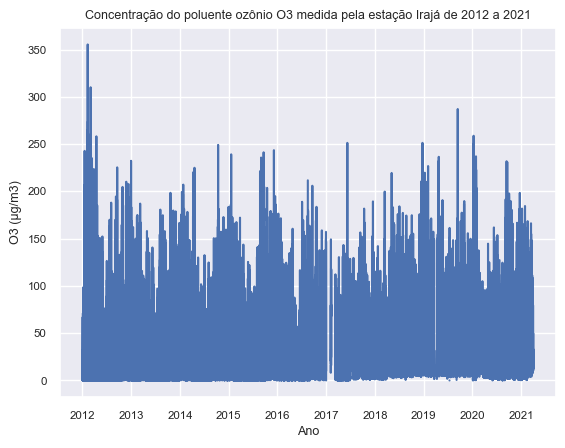

In [70]:
# Gráfico de linhas da série histórica do poluente Ozônio (O3)

sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.75) 
plt.ylabel("O3 (µg/m3)")
plt.xlabel("Ano")
plt.plot(dadoarIR['Data'], dadoarIR_grf['O3'])
plt.title('Concentração do poluente ozônio O3 medida pela estação Irajá de 2012 a 2021');

O gráfico de linhas da série do poluente O3, apresenta no ano de 2012 alta concentração do poluente, seguida do ano de 2019 que aparenta ter ocorrido ausência de medição neste ano. 

Outro ano que o gráfico permite visualizar tendo ocorrido ausência de medição, e neste ano em um período maior é o ano de 2017.

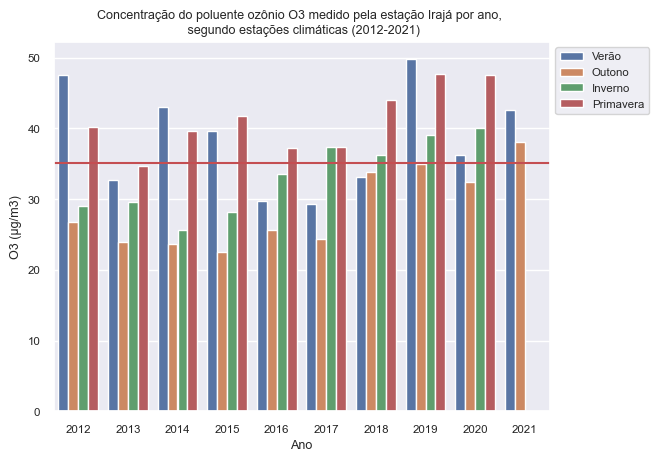

In [71]:
# Gráfico de barras referente à ozônio O3

gfg = sns.barplot(x = "Ano", y = "O3", hue = "estacao_ano", data = dadoarIR_grf, errorbar=None);
plt.axhline(y=35.12, color='r', linestyle='-')
plt.title("Concentração do poluente ozônio O3 medido pela estação Irajá por ano, \n segundo estações climáticas (2012-2021)")
plt.ylabel("O3 (µg/m3)")
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.show();

No gráfico de barras referente aos anos para o poluente O3 segundo às estações meteorológicas do ano é possível observar as maiores concentrações ocorrem na primavera e no verão, sugerindo alguma relação com altastemperaturas.

Verifica-se o mesmo comportamento tendo também ocorrido, ainda que em valores não muito experssivos, na estação verão dos anos de 2017 a 2020.

Através deste gráfico ainda não é possível observar em quais meses dos anos de 2017 e de 2019 possa ter ocorrido ausância de medição na estação, o que exige a construção de um gráfico informando os meses para tais anos.

In [72]:
# Selecionando no banco dadoarIR_grf os Anos de 2013 e 2020 

dadoarIR_2017_2019 = dadoarIR_grf[['O3','Ano','estacao_ano','Mes', 'nmes']]
dadoarIR_2017_2019 = dadoarIR_2017_2019.loc[ ( dadoarIR_grf ['Ano'] == 2017) | (dadoarIR_grf ['Ano'] == 2019 )] 

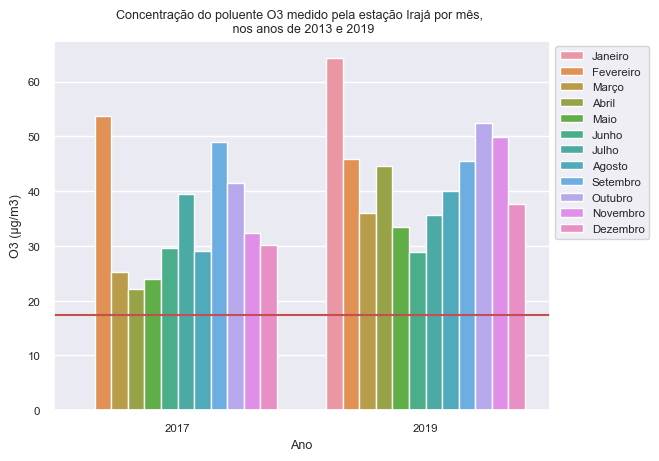

In [73]:
# Gráfico de barras referente ao O3

gfg = sns.barplot(x = "Ano", y = "O3", hue = "nmes", data = dadoarIR_2017_2019, errorbar=None);
plt.axhline(y=17.32, color='r', linestyle='-')
plt.title("Concentração do poluente O3 medido pela estação Irajá por mês, \n nos anos de 2013 e 2019")
plt.ylabel("O3 (µg/m3)")
gfg.legend(fontsize = 4.5)
gfg.legend(bbox_to_anchor = (1,1))
plt.show();

O gráfico de barras relativo aos anos de 2017 e 2019, segundo os meses apresenta ausência de medições no mês de janeiro do ano de 2017, sendo então passível de investigação, já para o ano de 2019, em relação aos meses nenhuma ausância é encontrada, o que sugere ter ocorrido em períodos de dias ou horas, sendo esta um período considerado pequeno e não significativo para a performance dos equipamentos da estação.

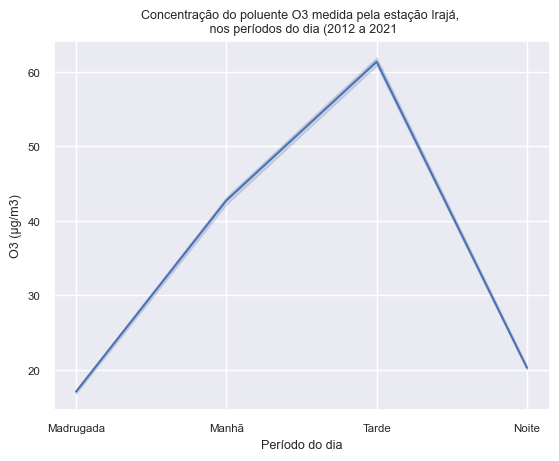

In [74]:
# Gráfico de linhas 

sns.lineplot(x='periodo_dia', y='O3', data = dadoarIR_grf)
plt.title('Concentração do poluente O3 medida pela estação Irajá, \n nos períodos do dia (2012 a 2021')
plt.xlabel("Período do dia")
plt.ylabel("O3 (µg/m3)");

O gráfico de linha confirma a suspeita de relação entre a concentração do poluente O3 com a alta temperatura, pois seu pico ocorre nos horários da manhã e à tarde, e os menores valores são observados nos horários sem a presença da luz solar, ou seja, à noite e na madrugada.

### 4.1.6 - Dióxido de Nitrogênio (NO2)

A longa exposição do 

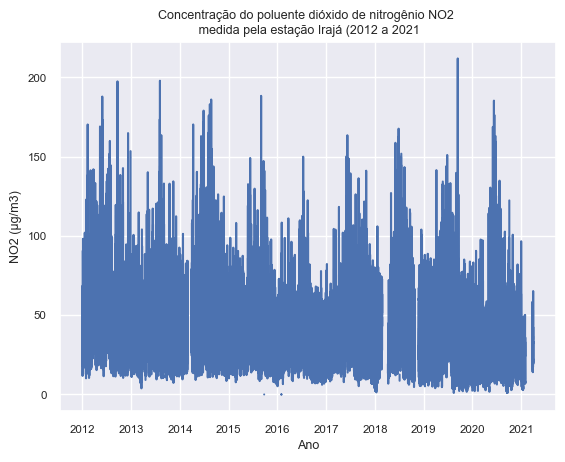

In [75]:
# Gráfico de linhas da série histórica do poluente NO2 dióxido de nitrogênio

sns.set_style('darkgrid')
sns.set_theme(style="darkgrid", font_scale=0.75) 
plt.ylabel("NO2 (µg/m3)")
plt.xlabel("Ano")
plt.plot(dadoarIR['Data'], dadoarIR_grf['NO2'])
plt.title('Concentração do poluente dióxido de nitrogênio NO2 \n medida pela estação Irajá (2012 a 2021');

Através do gráfico de linhas referente ao poluente NO2 para 
a série dos anos, nos anos de 2014, 2018 e 2019, é possível identificar falhas ou ausência na medição. Quanto à altas concentrações do poluente, o gráfico apresenta em vários anos, períodos de alta não representando períodos atípicos, com destaque apenas para o ano de 2019, tendo ocorrido a maior medição da série.

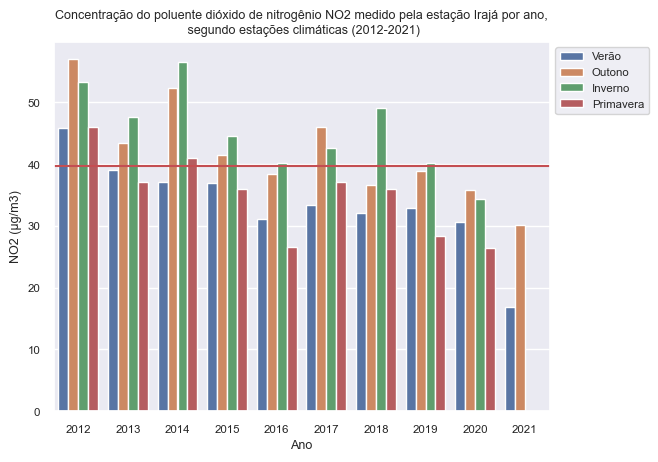

In [76]:
# Gráfico de barras referente à NO2

gfg = sns.barplot(x = "Ano", y = "NO2", hue = "estacao_ano", data = dadoarIR_grf, errorbar=None);
plt.axhline(y=39.7, color='r', linestyle='-')
plt.title("Concentração do poluente dióxido de nitrogênio NO2 medido pela estação Irajá por ano,\n segundo estações climáticas (2012-2021)")
plt.ylabel("NO2 (µg/m3)")
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.show();

Quando se verifica para o poluente NO2 o gráfico de barras nos anos segundo as estações meteorológica, o destaque ocorre em todo o ano de 2012 cuja concentração superou a média da séria de 39.7 µg/m3, representada pela linha em vermelho.

Outros períodos em que a concentração do poluente supera a média da série ocorreram nas estações do outono e inverno dos anos de 2013 a 2015, seguido dos anos de 2017 e 2018. 

Analisano o gráfico observa-se também a baixa influência dos períodos de altas temperaturas, no caso o verão e a primavera, na concentração de NO2. Para tal afirmação, torna-se interessante uma pesquisa mais aprofundada, pois esta assertiva contraria o que se verifica em grande parte dos estudos a respeito do tema.

In [77]:
# Selecionando no banco dadoarIR_grf os Anos de 2013 e 2020

dadoarIR_2012_2018 = dadoarIR_grf[['NO2','Ano','estacao_ano','Mes', 'nmes']]
dadoarIR_2012_2018 = dadoarIR_2012_2018.loc[ ( dadoarIR_grf ['Ano'] == 2012) | ( dadoarIR_grf ['Ano'] == 2013) | 
                                             ( dadoarIR_grf ['Ano'] == 2014) |( dadoarIR_grf ['Ano'] == 2015) |
                                             ( dadoarIR_grf ['Ano'] == 2017) |( dadoarIR_grf ['Ano'] == 2018)] 

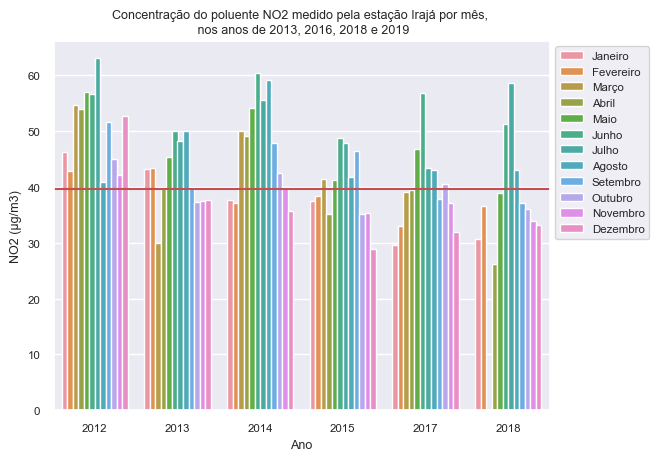

In [78]:
# Gráfico de barras referente ao poluente NO2

gfg = sns.barplot(x = "Ano", y = "NO2", hue = "nmes", data = dadoarIR_2012_2018, errorbar=None);
plt.axhline(y=39.7, color='r', linestyle='-')
plt.title("Concentração do poluente NO2 medido pela estação Irajá por mês, \n nos anos de 2013, 2016, 2018 e 2019")
plt.ylabel("NO2 (µg/m3)")
gfg.legend(fontsize=8)
gfg.legend(bbox_to_anchor= (1,1))
plt.show();

Devido a necessidade de se confirmar alguma ausência de medição da estação nos meses, são selecionados os anos de 2012 a 2015 e de 2017 a 2018, onde é possível identificar no mês de março de 2018 não tendo ocorrido medição, rpresentando uma ausêndia considerada significativa, sujeita à investigação sobre o desempenho dos equipamentos lá existentes.

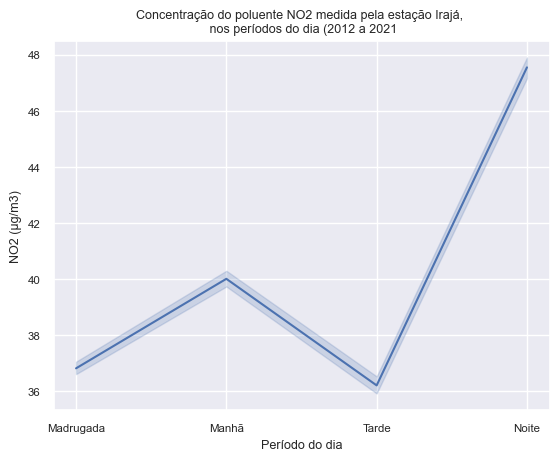

In [79]:
# Gráfico de linhas 

sns.lineplot(x='periodo_dia', y='NO2', data = dadoarIR_grf)
plt.title('Concentração do poluente NO2 medida pela estação Irajá, \n nos períodos do dia (2012 a 2021')
plt.xlabel("Período do dia")
plt.ylabel("NO2 (µg/m3)");

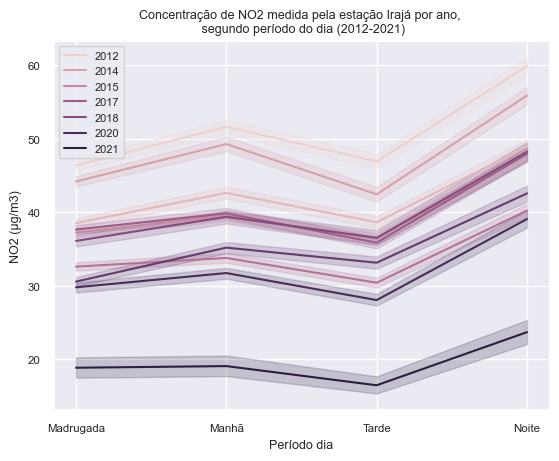

In [80]:
# Gráfico de linha da concentração de NO2 ao longo do dia

sns.lineplot(
    data=pd.DataFrame(dadoarIR_grf), 
    x="periodo_dia", y="NO2", hue="Ano",    
    sort=True
)
plt.title("Concentração de NO2 medida pela estação Irajá por ano, \n segundo período do dia (2012-2021)")
plt.xlabel("Período dia")
plt.ylabel("NO2 (µg/m3)")
plt.legend(fontsize=8);

O gráfico de linha acima para a concentração de NO2 segundo os períodos do dia permite observar seu crescimento no período da manhã.

## 4.2 - Visualizações Multimodais

Na visualizações multimodais, analisamos as relações de influência entre variáveis, utilizndo o dataset *dadoarIR_Medidas*, com apenas valores numéricos, identificamos através da matriz de correlação quais poluentes são de alguma forma correlacionados e o grau desta correlação, na análise consideramos como alta a correlação com valores em módulo acima de 0.7, podendo esta ser positiva ou negativa. 

O coeficiente de correlação varia de 1 a -1, onde quanto mais próximo de 1 representa forte correlação, próximo de -1 fraca correlação, e zero indica não haver correlação entre as variáveis.

O sinal do coeficiente de correlação quando positivo indica uma correlação positiva, ocorre quando os valores de uma variável aumentam, influenciam o mesmo comportamento na outra variável, ou seja, também aumenta. De forma análoga ocorre para o sinal negativo, que significa quando os valores da variável diminuem os valores da variável correlata também dimimuem.

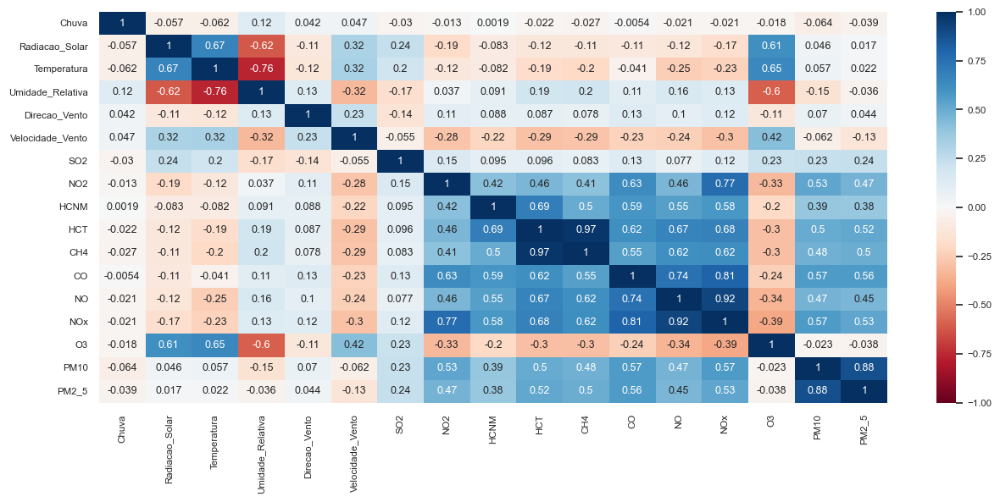

In [81]:
# Matriz de Correlação com Seaborn

plt.figure(figsize = (15,6))
sns.heatmap(dadoarIR_Medidas.corr(), annot=True, cmap='RdBu', vmin=-1, vmax=1);

Estabelecido o limite do índice de correlação acima definido, módulo de 0.7, foram verificados na análise, os seguintes poluentes considerados na análise, altamente correlacionados:

*   Temperatura x Umidade Relativa : -0.76 (Correlação negativa)
*   NO x NOx : 0.92 (Correlação positiva)
*   NO x CO : 0.74 (Correlação positiva)
*   NO2 X NOx : 0.92 (Correlação positiva)
*   CH4 x HCT : 0.97 (Correlação positiva)
*   PM10 x PM2.5 : 0.88 (Correlação positiva)

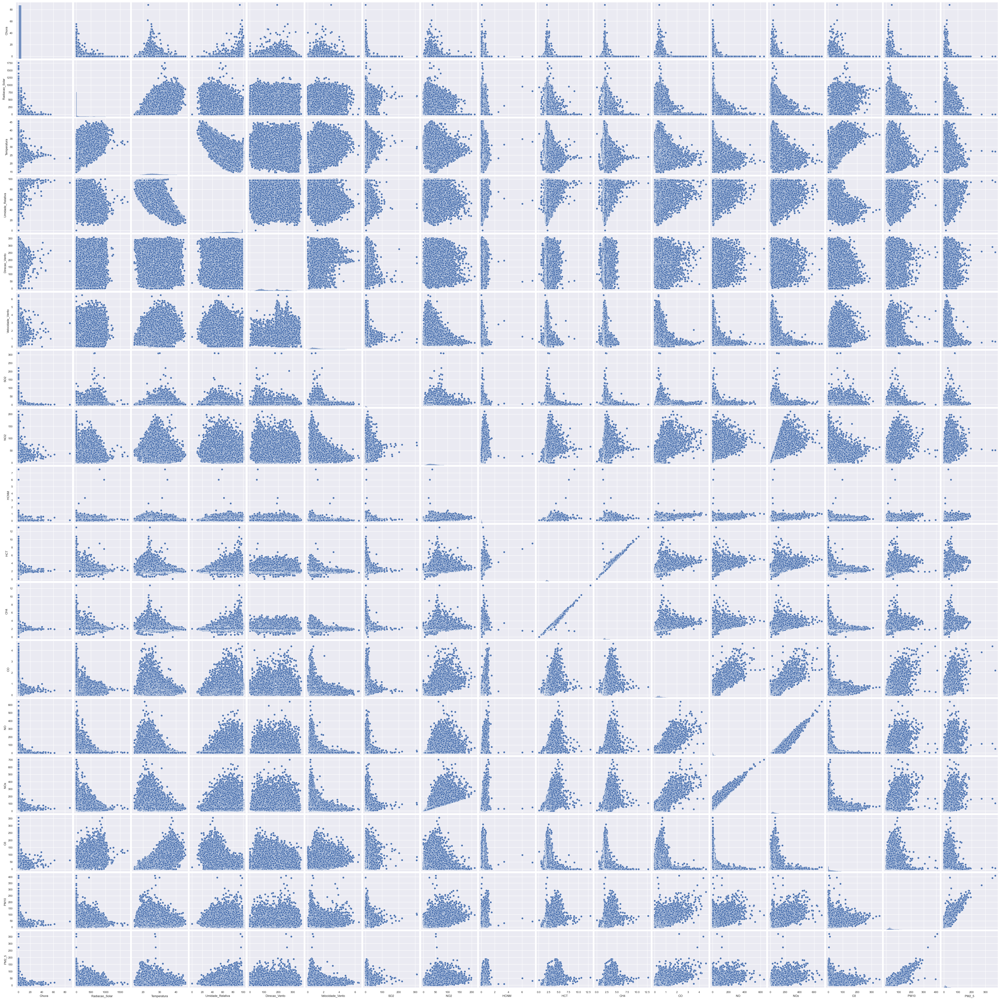

In [82]:
# Scatter Plot com Seaborn - Variação 1

sns.pairplot(dadoarIR_Medidas);

No gráfico anterior ScatterPlot são combinadas todas as possibilidades de correlação, permitindo selecionar graficamente a confirmação das correlações explanadas considerando o coeficiente de correlação.

# ***5 - Pré-Processamento***

## 5.1 - Verificando dados faltantes (missing)

Inicialmente com o comando a seguir verificamos em quais variávies e em que quantidade encontram-se valores faltantes ou missing.

In [83]:
# verificando nulls - valores faltantes no dataset

dadoarIR.isnull().sum()

Identificacao           0
Data                    0
Estacao                 0
Chuva                 469
Radiacao_Solar      11466
Temperatura          9921
Umidade_Relativa    16405
Direcao_Vento       13464
Velocidade_Vento    13462
SO2                 16696
NO2                  5932
HCNM                12803
HCT                 12877
CH4                 12802
CO                   7511
NO                   5945
NOx                  5936
O3                   6141
PM10                 3755
PM2_5                8442
Ano                     0
Mes                     0
Dia                     0
Hora                    0
Data_dt                 0
estacao_ano             0
estacao_ano_num         0
periodo_dia             0
nmes                    0
dtype: int64

O gráfico a seguir permite observar quais variáveis apresentam valores faltantes, permitindo verificar onde, então, é possível a complementação destes dados por alguma imputação. Várias são as possibilidades de resolver a retirada de missing, podendo ser retirando as linhas com estes, imputando estes valores com a média, mediana, valor zero, entre outras, em nosso caso utilizaremos a medida de posição mediana. 

Podemos observar no gráfico a Umidade Relativa, Temperatura, Radiação Solar, SO2 e CO como sendo aquelas com maiores quantidades de dados ausentes.

Assim o gráfico auxilia identificar em quais medições ocorreram possíveis falhas, colaborando em um dos objetivos do trabalho que é investigar a performance do equipamento usado na estação meteorológica.

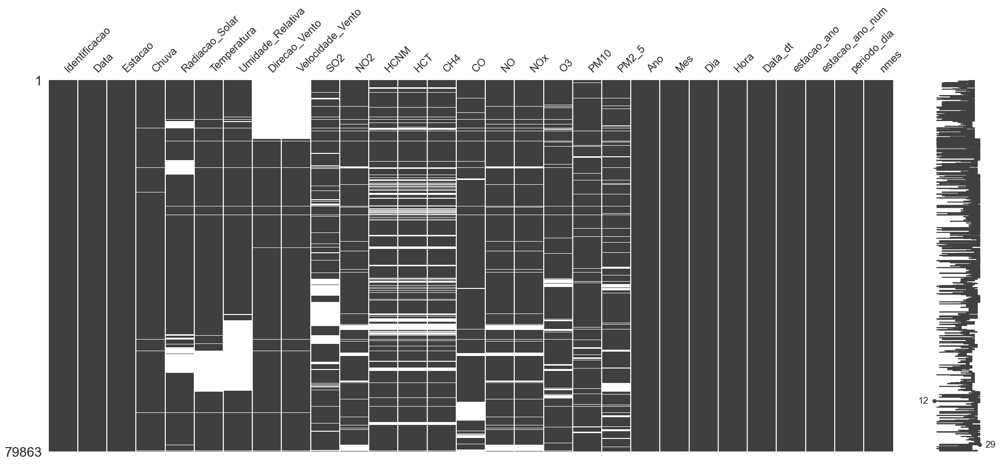

In [84]:
# salvando um novo dataset para tratamento de missings

# recuperando os nomes das colunas
col = list(dadoarIR.columns)

# o novo dataset irá conter todas as colunas do dataset original
dadoarIRSemMissings = dadoarIR[col[:]]

# exibindo visualização matricial do dataset antes da imputação
ms.matrix(dadoarIRSemMissings);

No trabalho utilizaremos a imputação pela mediana, dada a sua propriedade de não alterar a variabilidade em função de dados considerados discrepantes, ou seja, após a imputação poderemos observar que a distribuição da variável não se altera, não sofrendo influência destes dados.

In [86]:
# substituindo os NaN pela mediana da coluna

dadoarIRSemMissings['Chuva'].fillna(dadoarIRSemMissings['Chuva'].median(), inplace=True)
dadoarIRSemMissings['Radiacao_Solar'].fillna(dadoarIRSemMissings['Radiacao_Solar'].median(), inplace=True)
dadoarIRSemMissings['Temperatura'].fillna(dadoarIRSemMissings['Temperatura'].median(), inplace=True)
dadoarIRSemMissings['Umidade_Relativa'].fillna(dadoarIRSemMissings['Umidade_Relativa'].median(), inplace=True)
dadoarIRSemMissings['Direcao_Vento'].fillna(dadoarIRSemMissings['Direcao_Vento'].median(), inplace=True)
dadoarIRSemMissings['Velocidade_Vento'].fillna(dadoarIRSemMissings['Velocidade_Vento'].median(), inplace=True)
dadoarIRSemMissings['SO2'].fillna(dadoarIRSemMissings['SO2'].median(), inplace=True)
dadoarIRSemMissings['NO2'].fillna(dadoarIRSemMissings['NO2'].median(), inplace=True)
dadoarIRSemMissings['HCNM'].fillna(dadoarIRSemMissings['HCNM'].median(), inplace=True)
dadoarIRSemMissings['HCT'].fillna(dadoarIRSemMissings['HCT'].median(), inplace=True)
dadoarIRSemMissings['CH4'].fillna(dadoarIRSemMissings['CH4'].median(), inplace=True)
dadoarIRSemMissings['CO'].fillna(dadoarIRSemMissings['CO'].median(), inplace=True)
dadoarIRSemMissings['NO'].fillna(dadoarIRSemMissings['NO'].median(), inplace=True)
dadoarIRSemMissings['NOx'].fillna(dadoarIRSemMissings['NOx'].median(), inplace=True)
dadoarIRSemMissings['O3'].fillna(dadoarIRSemMissings['O3'].median(), inplace=True)
dadoarIRSemMissings['PM10'].fillna(dadoarIRSemMissings['PM10'].median(), inplace=True)
dadoarIRSemMissings['PM2_5'].fillna(dadoarIRSemMissings['PM2_5'].median(), inplace=True)

Após a imputação dos dados faltantes pela Mediana, a seguir verificamos seu resultado.

In [87]:
# verificando valores faltantes no dataset

dadoarIRSemMissings.isna().sum()

Identificacao       0
Data                0
Estacao             0
Chuva               0
Radiacao_Solar      0
Temperatura         0
Umidade_Relativa    0
Direcao_Vento       0
Velocidade_Vento    0
SO2                 0
NO2                 0
HCNM                0
HCT                 0
CH4                 0
CO                  0
NO                  0
NOx                 0
O3                  0
PM10                0
PM2_5               0
Ano                 0
Mes                 0
Dia                 0
Hora                0
Data_dt             0
estacao_ano         0
estacao_ano_num     0
periodo_dia         0
nmes                0
dtype: int64

A seguir temos novamente o gráfico matricial com os valores imputados pela mediana, sem dados faltantes.

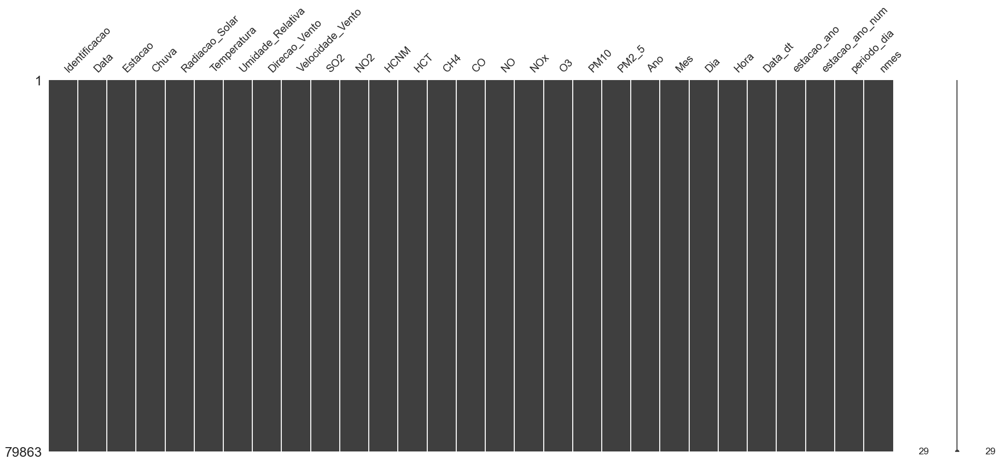

In [88]:
# Visualização matricial do dataset após a imputação

ms.matrix(dadoarIRSemMissings);

A análise descritiva a seguir, apresenta para alguns dos poluentes elevada distância entre valor mínimo e valor máximo, ou range definido pela diferença entre eles. Se compararmos a sua média, valor mínimo e valor máximo, estes poluentes possuem valores interessantes para a investigação a resppeito do que pode ter ocasionado tal leitura pela estação, principalmente se observarmos para estes a distância entre algum valor máximo ou mínimo e a média do poluente. Temos a seguir temos os poluentes que mais chamaram a atenção para este aspecto na análise e seus valores máximo, mínimo e média:

*   Chuva - média 0.13, valor mínimo 0 e valor máximo de 88;

*   SO2 - média 3.23, valor mínimo 0 e valor máximo de 309.13;

*   HCNM - média 0.1, valor mínimo 0 e valor máximo de 7.53;

*   HCT - média 1.85, valor mínimo 0 e valor máximo de 13.01;

*   CH4 - média 1.75, valor mínimo 0 e valor máximo de 12.73;

*   CO - média 0.4, valor mínimo 0 e valor máximo de 4.62;

*   NO - média 3.23, valor mínimo 0 e valor máximo de 309.13;

In [89]:
# Sumário estatístico para os atributos numéricos após a imputação 

dadoarIRSemMissings.describe()

,Identificacao,Chuva,Radiacao_Solar,Temperatura,Umidade_Relativa,Direcao_Vento,Velocidade_Vento,SO2,NO2,HCNM,HCT,CH4,CO,NO,NOx,O3,PM10,PM2_5,Ano,Mes,Dia,Hora,estacao_ano_num
count,79863.000000,79863.000000,79863.000000,79863.000000,79863.000000,79863.000000,79863.000000,79863.000000,79863.00000,79863.000000,79863.000000,79863.000000,79863.000000,79863.000000,79863.000000,79863.000000,79863.000000,79863.00000,79863.000000,79863.00000,79863.000000,79863.000000,79863.000000
mean,359485.039618,0.133859,148.600146,27.362163,68.689679,156.936800,1.154316,3.759105,39.46642,0.125355,2.189415,2.063230,0.443424,17.574142,57.120586,34.446219,37.016174,16.86148,2016.148630,6.42201,15.677711,11.502310,2.526051
std,153056.361705,1.214768,250.418744,4.559246,16.914053,75.002254,0.692738,6.125522,19.90618,0.119616,0.441456,0.368226,0.277156,33.019690,45.673338,32.634900,23.371415,13.96434,2.679367,3.48899,8.802804,6.922001,1.124934
min,223917.000000,0.000000,0.000000,14.600000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.090000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2012.000000,1.00000,1.000000,0.000000,1.000000
25%,243882.500000,0.000000,0.000000,24.320000,59.180000,91.170000,0.730000,1.060000,25.89000,0.070000,1.960000,1.880000,0.290000,3.460000,30.850000,10.360000,22.000000,8.00000,2014.000000,3.00000,8.000000,6.000000,2.000000
50%,263848.000000,0.000000,5.830000,26.750000,70.095000,150.830000,0.980000,2.510000,36.32000,0.100000,2.090000,1.980000,0.390000,7.140000,44.930000,26.320000,32.000000,13.00000,2016.000000,6.00000,16.000000,12.000000,3.000000
75%,503444.500000,0.000000,206.500000,29.680000,79.250000,208.670000,1.330000,4.290000,48.81000,0.140000,2.260000,2.120000,0.520000,16.330000,67.390000,47.760000,45.000000,21.00000,2018.000000,9.00000,23.000000,18.000000,4.000000
max,642177.000000,88.000000,1752.670000,45.650000,100.000000,358.830000,6.480000,309.130000,211.81000,7.530000,13.010000,12.730000,4.620000,640.380000,702.670000,355.450000,409.000000,370.00000,2021.000000,12.00000,31.000000,23.000000,4.000000


## 5.2 - Transformações Numéricas

Nesta etapa de Transformações Numéricas do pré-processamento, será utilizado o banco apenas com medições, ou seja, apenas valores numéricos, devido as transformações a seguir não se aplicarem a dados categóricos, assim a seguir é feita a seleção criando um o novo dataset "dadoarIR_Medidas_sem_missing", a ser utilizado no tratamento de normalização e de padronização dos dados.

In [90]:
# Selecionando apenas os atributos que representam medição da estação

dadoarIR_Medidas_sem_missing = dadoarIRSemMissings[['Chuva','Radiacao_Solar','Temperatura','Umidade_Relativa','Direcao_Vento',
                                                    'Velocidade_Vento','SO2','NO2','HCNM','HCT','CH4',
                                                    'CO','NO','NOx','O3','PM10','PM2_5']]

In [91]:
# Verificando o formato do banco dadoarIR_Medidas_sem_missing.info()

dadoarIR_Medidas_sem_missing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79863 entries, 0 to 79862
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Chuva             79863 non-null  float64
 1   Radiacao_Solar    79863 non-null  float64
 2   Temperatura       79863 non-null  float64
 3   Umidade_Relativa  79863 non-null  float64
 4   Direcao_Vento     79863 non-null  float64
 5   Velocidade_Vento  79863 non-null  float64
 6   SO2               79863 non-null  float64
 7   NO2               79863 non-null  float64
 8   HCNM              79863 non-null  float64
 9   HCT               79863 non-null  float64
 10  CH4               79863 non-null  float64
 11  CO                79863 non-null  float64
 12  NO                79863 non-null  float64
 13  NOx               79863 non-null  float64
 14  O3                79863 non-null  float64
 15  PM10              79863 non-null  float64
 16  PM2_5             79863 non-null  float6

### 5.2.1 - Normalizando o Banco de dados

Para a Normalização inicialmente é realizada a transformação do banco de dados dataframe, como visto anteriormente, para um vetor.

In [92]:
# Normalização do banco dadoarIR_Medidas_sem_missing

datanorm = np.asarray(dadoarIR_Medidas_sem_missing)

In [93]:
# Verificando o banco Normalizado, agora como array

datanorm

array([[ 0.8 ,  0.83, 24.84, ..., 25.03, 89.  , 85.  ],
       [ 0.  ,  1.  , 24.68, ..., 22.95, 33.  , 32.  ],
       [ 0.  ,  1.  , 24.56, ..., 22.31, 19.  , 14.  ],
       ...,
       [ 0.  ,  6.  , 26.7 , ..., 21.3 , 26.  ,  7.  ],
       [ 1.8 ,  6.  , 25.8 , ..., 17.11, 30.  , 11.  ],
       [ 0.2 ,  7.  , 23.4 , ..., 12.21, 43.  , 20.  ]])

In [94]:
# Definindo o transformador como min max scaler

scaler = MinMaxScaler()


# Transformando os dados

scaled = scaler.fit_transform(datanorm)
print(scaled)

[[0.00909091 0.00047356 0.32979066 ... 0.07041778 0.21760391 0.22972973]
 [0.         0.00057056 0.32463768 ... 0.06456604 0.0806846  0.08648649]
 [0.         0.00057056 0.32077295 ... 0.06276551 0.04645477 0.03783784]
 ...
 [0.         0.00342335 0.38969404 ... 0.05992404 0.06356968 0.01891892]
 [0.02045455 0.00342335 0.36070853 ... 0.04813617 0.07334963 0.02972973]
 [0.00227273 0.00399391 0.28341385 ... 0.03435082 0.10513447 0.05405405]]


Após a normalização deseja-se realizar o caminho inverso, ou seja, a transformação do array em um Dataframe, que será denominado "dadoarIR_Normalizado", onde o array não possui nome em suas colunas, com cuidado deve-se nomear as colunas obedecendo a ordem das mesmas oriundas do Dataframe original, no caso, dadoarIR_Medidas.

In [95]:
# Selecionando as colunas de interesse para a Transformação do array em um DataFrame 

colnames = ['Chuva','Radiacao_Solar','Temperatura','Umidade_Relativa','Direcao_Vento',
            'Velocidade_Vento','SO2','NO2','HCNM','HCT','CH4','CO','NO','NOx','O3','PM10','PM2_5']

dadoarIR_Normalizado = pd.DataFrame(scaled, columns = colnames)

A seguir são exibidos o banco original "dadorarIR" seguido do banco normalizado "dadoarIR_Normalizado"

In [96]:
# Exibindo os dados transformados

print("Dados Originais: \n\n", dadoarIR.values)
print("\nDados Normalizados : \n\n", dadoarIR_Normalizado)

Dados Originais: 

 [[223917 Timestamp('2012-01-01 00:30:00+0000', tz='UTC') 'IR' ... 4
  'Madrugada' 'Janeiro']
 [223918 Timestamp('2012-01-01 01:30:00+0000', tz='UTC') 'IR' ... 4
  'Madrugada' 'Janeiro']
 [223919 Timestamp('2012-01-01 02:30:00+0000', tz='UTC') 'IR' ... 4
  'Madrugada' 'Janeiro']
 ...
 [642175 Timestamp('2021-03-31 21:30:00+0000', tz='UTC') 'IR' ... 1
  'Noite' 'Março']
 [642176 Timestamp('2021-03-31 22:30:00+0000', tz='UTC') 'IR' ... 1
  'Noite' 'Março']
 [642177 Timestamp('2021-03-31 23:30:00+0000', tz='UTC') 'IR' ... 1
  'Noite' 'Março']]

Dados Normalizados : 

           Chuva  Radiacao_Solar  Temperatura  Umidade_Relativa  Direcao_Vento  \
0      0.009091        0.000474     0.329791            0.9712       0.420338   
1      0.000000        0.000571     0.324638            0.9600       0.420338   
2      0.000000        0.000571     0.320773            0.9639       0.420338   
3      0.000000        0.000571     0.323671            0.9687       0.420338   
4   

Finalizando o processo de Normalização, o banco normalizado será preservado com apenas os valores numéricos "dadoarIR_Norm_Num" para ser utilizado na construção dos gráficos e no banco "dadoarIR_Normalizado" serão acrescidas as variáveis categóricas, até então não consideradas no tratamento de Normalização.

In [97]:
# Guardando o banco Normalizado com as medições

dadoarIR_Norm_Num = dadoarIR_Normalizado[['Chuva','Radiacao_Solar','Temperatura','Umidade_Relativa','Direcao_Vento',
                                          'Velocidade_Vento','SO2','NO2','HCNM','HCT','CH4',
                                          'CO','NO','NOx','O3','PM10','PM2_5']]


# Acrescentando o atributo Ano e Estação do ano ao novo DataFrame normalizado

dadoarIR_Normalizado['Data'] = dadoarIR['Data']
dadoarIR_Normalizado['Ano'] = dadoarIR['Ano']
dadoarIR_Normalizado['estacao_ano'] = dadoarIR['estacao_ano']

print(dadoarIR_Normalizado)

          Chuva  Radiacao_Solar  Temperatura  Umidade_Relativa  Direcao_Vento  \
0      0.009091        0.000474     0.329791            0.9712       0.420338   
1      0.000000        0.000571     0.324638            0.9600       0.420338   
2      0.000000        0.000571     0.320773            0.9639       0.420338   
3      0.000000        0.000571     0.323671            0.9687       0.420338   
4      0.000000        0.000571     0.323994            0.9632       0.420338   
...         ...             ...          ...               ...            ...   
79858  0.000000        0.003423     0.398712            0.6072       0.631218   
79859  0.000000        0.003520     0.393559            0.6065       0.633085   
79860  0.000000        0.003423     0.389694            0.6043       0.695315   
79861  0.020455        0.003423     0.360709            0.7195       0.833737   
79862  0.002273        0.003994     0.283414            0.9757       0.858819   

       Velocidade_Vento    

#### 5.2.1.1 - Gráfico Histograma dos dados Normalizados

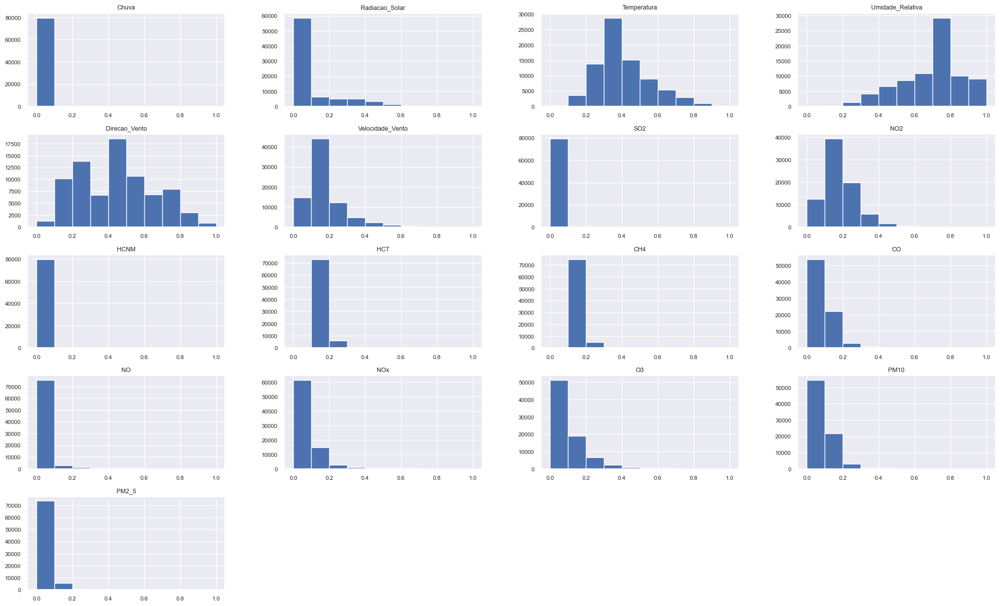

In [98]:
# Gráfico Histograma dos dados normalizados

dadoarIR_Norm_Num.hist(figsize = (25,15))
plt.show()

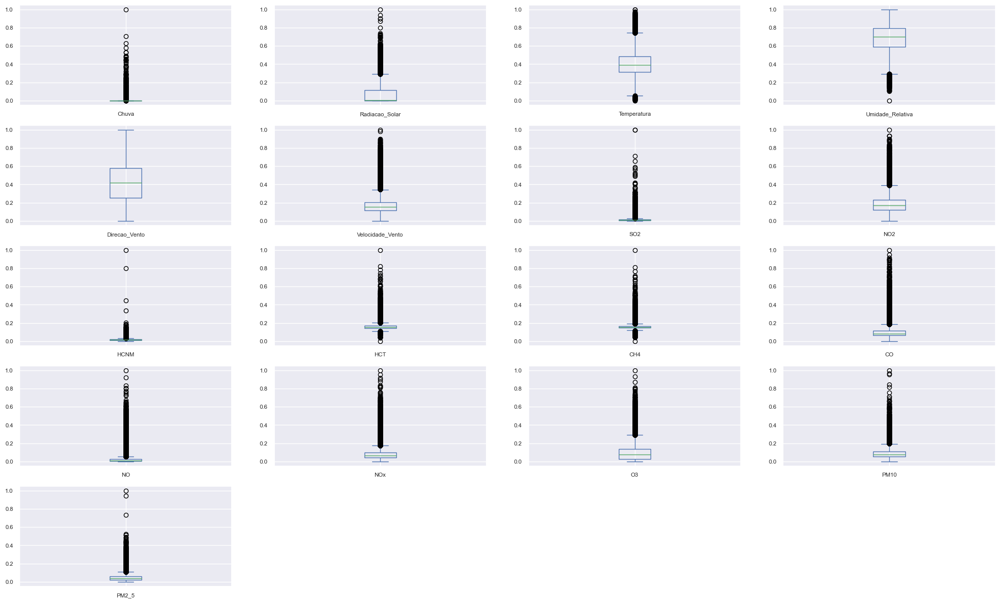

In [99]:
# Boxplot dos dados normalizado

dadoarIR_Norm_Num.plot(kind = 'box', subplots = True, layout = (5,4), sharex = False, sharey = False, figsize = (25,15))
plt.show()

### 5.2.2 - Padronizando o Banco de dados

O tratamento de Padronização ocorre em uma sequência de passos muito semelhantes às utilizadas na normalização, novamente utilizando nesta fase inicial da padronização o banco "dadoarIR_Medidas_sem_missing", onde este não existem dados categóricos, como também sem a presença de dados ausentes (missings).

Através da função "StandStandardScaler" é realizada a transformação de padronização dos dados, que consiste no cálculo abaixo do valor Z para cada uma das observações $X_i$ de forma a obtermos para a distribuição média $µ = zero$ e desvio-padrão $σ =1$ igual à um, com o objetivo das variáveis possuírem apenas valores entre zero e um, desta forma a distribuição aproximando-se de uma distribuição normal: $Z = \frac{\Large X_i - µ}{σ}$

In [100]:
# Padronizando os dados

dadoarIR_Padrnz = StandardScaler().fit_transform(dadoarIR_Medidas_sem_missing)

In [101]:
# Exibindo os dados transformados

print("Dados Originais: \n\n", dadoarIR_Medidas.values)
print("\nDados Padronizados: \n\n", dadoarIR_Padrnz)

Dados Originais: 

 [[ 0.8   0.83 24.84 ... 25.03 89.   85.  ]
 [ 0.    1.   24.68 ... 22.95 33.   32.  ]
 [ 0.    1.   24.56 ... 22.31 19.   14.  ]
 ...
 [ 0.    6.   26.7  ... 21.3  26.    7.  ]
 [ 1.8   6.   25.8  ... 17.11 30.   11.  ]
 [ 0.2   7.   23.4  ... 12.21 43.   20.  ]]

Dados Padronizados: 

 [[ 0.54837208 -0.59009589 -0.55320084 ... -0.28853397  2.22426203
   4.87949642]
 [-0.11019393 -0.58941702 -0.58829458 ... -0.35226982 -0.17184237
   1.08409099]
 [-0.11019393 -0.58941702 -0.61461488 ... -0.37188085 -0.77086848
  -0.20491463]
 ...
 [-0.11019393 -0.56945034 -0.14523612 ... -0.40282951 -0.47135543
  -0.70619459]
 [ 1.37157959 -0.56945034 -0.3426384  ... -0.53122047 -0.30020511
  -0.4197489 ]
 [ 0.05444758 -0.565457   -0.8690445  ... -0.68136742  0.25603341
   0.22475391]]


In [102]:
# Transformando o array em um DataFrame 

colnames = ['Chuva','Radiacao_Solar','Temperatura','Umidade_Relativa','Direcao_Vento',
                             'Velocidade_Vento','SO2','NO2','HCNM','HCT','CH4',
                             'CO','NO','NOx','O3','PM10','PM2_5']

dadoarIR_Padrnz = pd.DataFrame(scaled, columns = colnames)

print(dadoarIR_Padrnz)

          Chuva  Radiacao_Solar  Temperatura  Umidade_Relativa  Direcao_Vento  \
0      0.009091        0.000474     0.329791            0.9712       0.420338   
1      0.000000        0.000571     0.324638            0.9600       0.420338   
2      0.000000        0.000571     0.320773            0.9639       0.420338   
3      0.000000        0.000571     0.323671            0.9687       0.420338   
4      0.000000        0.000571     0.323994            0.9632       0.420338   
...         ...             ...          ...               ...            ...   
79858  0.000000        0.003423     0.398712            0.6072       0.631218   
79859  0.000000        0.003520     0.393559            0.6065       0.633085   
79860  0.000000        0.003423     0.389694            0.6043       0.695315   
79861  0.020455        0.003423     0.360709            0.7195       0.833737   
79862  0.002273        0.003994     0.283414            0.9757       0.858819   

       Velocidade_Vento    

In [103]:
# Guardando o banco Normalizado com as medições

dadoarIR_Padrnz_Num = dadoarIR_Padrnz[['Chuva','Radiacao_Solar','Temperatura','Umidade_Relativa',
                                       'Direcao_Vento','Velocidade_Vento','SO2','NO2','HCNM','HCT',
                                       'CH4','CO','NO','NOx','O3','PM10','PM2_5']]
                                       

# Acrescentando o atributo Ano e Estação do ano ao novo DataFrame padronizado

dadoarIR_Padrnz['Ano'] = dadoarIR['Ano']
dadoarIR_Padrnz['estacao_ano'] = dadoarIR['estacao_ano']

print(dadoarIR_Padrnz)

          Chuva  Radiacao_Solar  Temperatura  Umidade_Relativa  Direcao_Vento  \
0      0.009091        0.000474     0.329791            0.9712       0.420338   
1      0.000000        0.000571     0.324638            0.9600       0.420338   
2      0.000000        0.000571     0.320773            0.9639       0.420338   
3      0.000000        0.000571     0.323671            0.9687       0.420338   
4      0.000000        0.000571     0.323994            0.9632       0.420338   
...         ...             ...          ...               ...            ...   
79858  0.000000        0.003423     0.398712            0.6072       0.631218   
79859  0.000000        0.003520     0.393559            0.6065       0.633085   
79860  0.000000        0.003423     0.389694            0.6043       0.695315   
79861  0.020455        0.003423     0.360709            0.7195       0.833737   
79862  0.002273        0.003994     0.283414            0.9757       0.858819   

       Velocidade_Vento    

#### 5.2.2.1 - Gráfico Histograma dos dados Padronizados

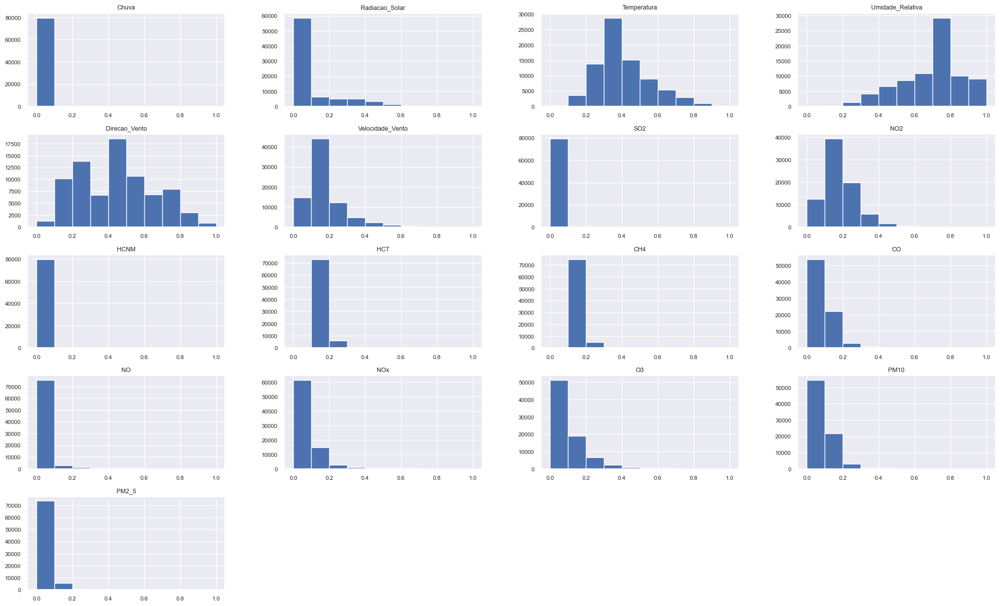

In [104]:
# Gráfico Histograma dos dados padronizados

dadoarIR_Padrnz_Num.hist(figsize = (25,15))
plt.show()

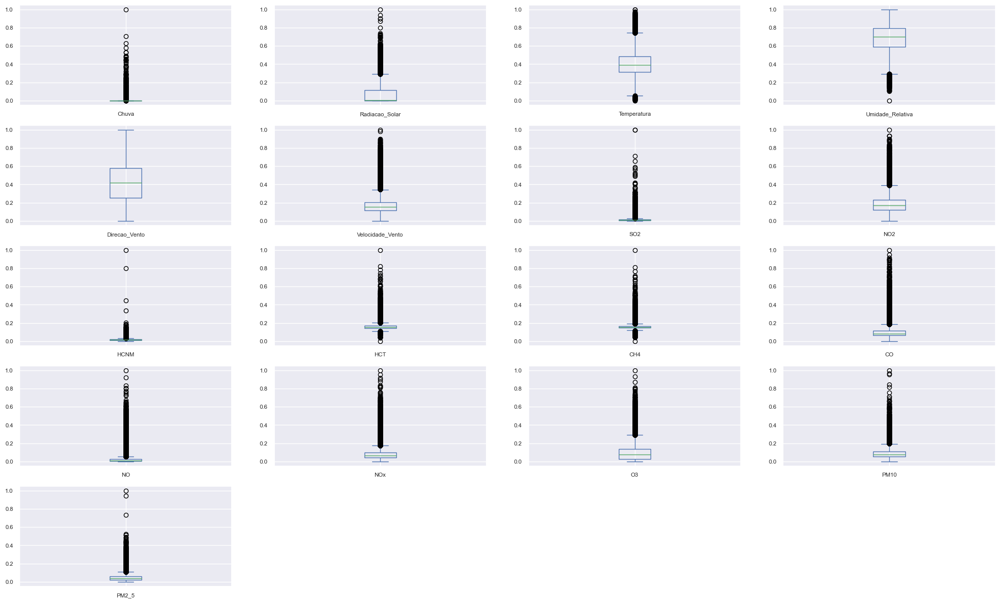

In [105]:
# Boxplot dos dados padronizados

dadoarIR_Padrnz_Num.plot(kind = 'box', subplots = True, layout = (5,4), sharex = False, sharey = False, figsize = (25,15))
plt.show()

## 5.3 - Transformações Categóricas

#### 5.3.1 - Codificação Ordinal

In [106]:
# separando o array em componentes de input e output
X = dadoarIRSemMissings.values[:,0:16]
y = dadoarIRSemMissings.values[:,16]

In [107]:
# ordinal encoding para os atributos X
encoded_X = OrdinalEncoder().fit_transform(X)

# exibindo os dados transformados
print("Atributos transformados:")
print(encoded_X[:5, :]) # 5 primeiras linhas, todas as colunas

Atributos transformados:
[[0.000e+00 0.000e+00 0.000e+00 8.000e+00 9.000e+00 7.940e+02 6.432e+03
  1.564e+03 9.100e+01 2.550e+02 1.607e+03 6.800e+01 1.510e+02 1.000e+02
  4.000e+01 2.200e+01]
 [1.000e+00 1.000e+00 0.000e+00 0.000e+00 1.000e+01 7.780e+02 6.339e+03
  1.564e+03 9.100e+01 4.500e+01 1.489e+03 6.500e+01 1.540e+02 1.070e+02
  3.500e+01 6.700e+01]
 [2.000e+00 2.000e+00 0.000e+00 0.000e+00 1.000e+01 7.660e+02 6.374e+03
  1.564e+03 9.100e+01 1.100e+01 1.397e+03 6.600e+01 1.570e+02 1.090e+02
  3.400e+01 3.800e+01]
 [3.000e+00 3.000e+00 0.000e+00 0.000e+00 1.000e+01 7.750e+02 6.413e+03
  1.564e+03 9.100e+01 7.000e+01 1.847e+03 6.900e+01 1.580e+02 1.070e+02
  3.700e+01 4.300e+01]
 [4.000e+00 4.000e+00 0.000e+00 0.000e+00 1.000e+01 7.760e+02 6.367e+03
  1.564e+03 9.100e+01 7.900e+01 1.726e+03 6.800e+01 1.590e+02 1.080e+02
  3.200e+01 2.300e+01]]


#### 5.3.2 - One-hot encoding 

In [108]:
# one hot encode para os atributos X
encoded_X = OneHotEncoder(sparse=False).fit_transform(X)

# exibindo os dados transformados
print("Atributos transformados:")
print(encoded_X[:5, :]) # 5 primeiras linhas, todas as colunas

/Users/nicolebidigaray/anaconda3/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:828: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Atributos transformados:
[[1. 0. 0. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


## 5.4 - Separação dos dados para treinamento e teste

A preparação dos dados para a próxima fase do trabalho consistirá da etapa de separação dos dados em dois conjuntos, um para treinamento e outro para teste, estes bancos serão utilizados para uso em modelos de Machine Learning.

Podemos observar que no banco de dados a ser utiizado dadoarIRSemMissing possui atributos numéricos e categóricos, então é necessário a seleção de apenas os atributos numéricos, os quais serão usados na separação dos dados.

In [109]:
# Verificando quais atributos são numéricos e categóricos

dadoarIRSemMissings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79863 entries, 0 to 79862
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   Identificacao     79863 non-null  int64              
 1   Data              79863 non-null  datetime64[ns, UTC]
 2   Estacao           79863 non-null  object             
 3   Chuva             79863 non-null  float64            
 4   Radiacao_Solar    79863 non-null  float64            
 5   Temperatura       79863 non-null  float64            
 6   Umidade_Relativa  79863 non-null  float64            
 7   Direcao_Vento     79863 non-null  float64            
 8   Velocidade_Vento  79863 non-null  float64            
 9   SO2               79863 non-null  float64            
 10  NO2               79863 non-null  float64            
 11  HCNM              79863 non-null  float64            
 12  HCT               79863 non-null  float64            
 13  C

Selecionando a seguir em um novo dataset dadoarIRSemMissings_predt apenas os atributos numéricos do banco *dadoarIRSemMissing* inserindo a variável Mes como variável preditora.

In [110]:
# Selecionando no novo dataset 

dadoarIRSemMissings_predt = dadoarIRSemMissings.loc[ : , ['Chuva','Radiacao_Solar','Temperatura','Umidade_Relativa', 
                                                          'Direcao_Vento','Velocidade_Vento','SO2','NO2','HCNM','HCT',
                                                          'CH4','CO','NO','NOx','O3','PM10','PM2_5','estacao_ano_num']]

Verificando no banco dadoarIRSemMissings_predt os 5 primeiros e os 5 últimos registros.

In [111]:
# Mostrando os 5 primeiros registros

dadoarIRSemMissings_predt.head()

,Chuva,Radiacao_Solar,Temperatura,Umidade_Relativa,Direcao_Vento,Velocidade_Vento,SO2,NO2,HCNM,HCT,CH4,CO,NO,NOx,O3,PM10,PM2_5,estacao_ano_num
0,0.8,0.83,24.84,97.12,150.83,0.98,2.55,20.09,0.68,2.52,1.83,0.40,0.23,20.20,25.03,89.0,85.0,4
1,0.0,1.00,24.68,96.00,150.83,0.98,0.45,18.91,0.65,2.55,1.90,0.35,0.68,19.60,22.95,33.0,32.0,4
2,0.0,1.00,24.56,96.39,150.83,0.98,0.11,17.99,0.66,2.58,1.92,0.34,0.39,18.33,22.31,19.0,14.0,4
3,0.0,1.00,24.65,96.87,150.83,0.98,0.70,22.49,0.69,2.59,1.90,0.37,0.44,22.93,17.98,12.0,12.0,4
4,0.0,1.00,24.66,96.32,150.83,0.98,0.79,21.28,0.68,2.60,1.91,0.32,0.24,21.52,18.88,10.0,10.0,4


In [112]:
# Mostrando os 5 últimos registros

dadoarIRSemMissings_predt.tail()

,Chuva,Radiacao_Solar,Temperatura,Umidade_Relativa,Direcao_Vento,Velocidade_Vento,SO2,NO2,HCNM,HCT,CH4,CO,NO,NOx,O3,PM10,PM2_5,estacao_ano_num
79858,0.0,6.00,26.98,60.72,226.50,1.20,11.11,30.38,0.04,2.14,2.10,0.39,7.94,38.32,17.04,29.0,0.0,1
79859,0.0,6.17,26.82,60.65,227.17,1.25,12.12,28.38,0.02,2.08,2.05,0.39,6.71,35.09,18.76,28.0,2.0,1
79860,0.0,6.00,26.70,60.43,249.50,0.85,11.12,24.53,0.11,2.50,2.39,0.39,5.05,29.58,21.30,26.0,7.0,1
79861,1.8,6.00,25.80,71.95,299.17,1.15,11.26,28.75,0.03,2.09,2.06,0.39,4.19,32.94,17.11,30.0,11.0,1
79862,0.2,7.00,23.40,97.57,308.17,1.23,10.92,33.24,0.03,2.14,2.11,0.39,4.29,37.53,12.21,43.0,20.0,1


In [113]:
# Verificando os atributos do novo dataset dadoarIRSemMissings_predt

dadoarIRSemMissings_predt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79863 entries, 0 to 79862
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Chuva             79863 non-null  float64
 1   Radiacao_Solar    79863 non-null  float64
 2   Temperatura       79863 non-null  float64
 3   Umidade_Relativa  79863 non-null  float64
 4   Direcao_Vento     79863 non-null  float64
 5   Velocidade_Vento  79863 non-null  float64
 6   SO2               79863 non-null  float64
 7   NO2               79863 non-null  float64
 8   HCNM              79863 non-null  float64
 9   HCT               79863 non-null  float64
 10  CH4               79863 non-null  float64
 11  CO                79863 non-null  float64
 12  NO                79863 non-null  float64
 13  NOx               79863 non-null  float64
 14  O3                79863 non-null  float64
 15  PM10              79863 non-null  float64
 16  PM2_5             79863 non-null  float6

In [114]:
# Confirmando total de linhas e colunas do novo dataset

dadoarIRSemMissings_predt.shape

(79863, 18)

In [115]:
test_size = 0.20
seed = 7

array = dadoarIRSemMissings_predt.values

X_sm = array[ : , 0:17 ]
y_sm = array[: , 17 ]

X_train_sm, X_test_sm, y_train_sm, y_test_sm = train_test_split(X_sm, y_sm,
    test_size=test_size, shuffle=True, random_state=seed, stratify=y_sm)

In [116]:
X_train_sm

array([[  2.  ,  26.17,  26.55, ...,  26.32,  23.  ,  18.  ],
       [  0.  ,   5.83,  36.73, ...,  77.76,  30.  ,  11.  ],
       [  0.  ,   5.83,  38.42, ...,  63.17,  30.  ,  10.  ],
       ...,
       [  0.8 ,   0.  ,  18.53, ...,  46.6 ,   9.  ,   4.  ],
       [  0.  , 452.33,  33.48, ...,  89.95,  19.  ,  16.  ],
       [  0.  , 509.5 ,  30.87, ...,  53.59,  16.  ,   4.  ]])

In [117]:
y_train_sm

array([4., 4., 4., ..., 2., 1., 1.])

In [118]:
X_test_sm

array([[0.0000e+00, 5.8300e+00, 2.6750e+01, ..., 6.8610e+01, 2.9000e+01,
        9.0000e+00],
       [1.0000e+00, 3.3000e-01, 2.2530e+01, ..., 5.7600e+00, 9.0000e+00,
        5.0000e+00],
       [0.0000e+00, 4.8633e+02, 2.6750e+01, ..., 5.9510e+01, 1.3000e+01,
        7.0000e+00],
       ...,
       [0.0000e+00, 0.0000e+00, 2.3650e+01, ..., 4.3300e+01, 7.0000e+00,
        0.0000e+00],
       [0.0000e+00, 0.0000e+00, 2.7380e+01, ..., 5.4000e-01, 2.0000e+01,
        8.0000e+00],
       [0.0000e+00, 4.3117e+02, 3.0250e+01, ..., 5.2050e+01, 3.1000e+01,
        1.3000e+01]])

In [119]:
y_test_sm

array([3., 1., 1., ..., 3., 1., 2.])

# ***6 - Conclusão*** 

A análise dos dados sobre os poluentes e fenômenos meteorológicos teve como um dos objetivos principais, auxiliar no monitoramento das estações meteorológicas, ainda que o estudo não ofereça a causa de uma ausência de medições pela estação, foi possível verificar os períodos em que estas falhas ocorreram. A partir desta verificação pode-se dizer ser o início da investigação desta causa, dado que a mesma pode ser proveniente de uma falha no equipamento ou ainda um momento em que este possa estar passando por alguma manutenção, permitindo inclusive, avaliar a performance de diferentes marcas de equipamentos utilizados no período estudado entre os anos de 2012 e 2021.

Outra possibilidade presente na análise consiste na obtenção de conhecimento do comportamento dos poluentes ao longo do período, considerando não apenas como períodos de tempo os anos, mas também o mês, o período do dia (manhã, tarde e noite) e as estações meteorológicas anuais (primavera, verão, outono e inverno), assim a partir da identificação do tempo passa a ser interessante em uma próxima análise integrar a questão espacial, verificando também os locais de ocorrência dos eventos meteorológicos e finalmente integrá-los às ocorrências de internações hospitalares voltadas para o grupo de doenças respiratórias e cardiovasculares afim de predizer o quanto estas estão relacionadas com a qualidade do ar.


# ***7 - Referência Bibliográfica*** 

MONTE, Edson Zambon; ALBUQUERQUE, Taciana Toledo de Almeida; REISEN, Valdério Anselmo. Impactos das variáveis meteorológicas na qualidade do ar da Região da Grande Vitória, Espírito Santo, Brasil. Revista Brasileira de Meteorologia, v. 31, p. 546-554, 2016.

RINTZEL, Claudete Hanauer et al. OS EFEITOS DA POLUIÇÃO ATMOSFÉRICA E A VIGILÂNCIA EM SAÚDE AMBIENTAL E QUALIDADE DO AR. Anuário Pesquisa e Extensão Unoesc Joaçaba, v. 8, p. e32548-e32548, 2023.

SANTOS, Haroldo Lima et al. Relação entre poluentes atmosféricos e suas consequências para a saúde. Revista Científica Intr@ ciência, v. 17, p. 01-24, 2019.
